In [29]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score


df=pd.read_csv('details_54feet_up.csv')

df.info()
model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)
X_d_2=pd.get_dummies(X_d)

y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d_2,y_d,test_size=0.2,random_state=42)
print(X_train)
n_cols=X_train.shape[1]
print(n_cols)

model.add(Dense(32, activation='relu', input_shape=(n_cols,)))
model.add(Dense(64, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(256, activation='relu'))
model.add(Dense(256, activation='relu'))
model.add(Dense(512, activation='relu'))
#model.add(Dense(512, activation='relu'))
model.add(Dense(600, activation='relu'))
#model.add(Dense(1000, activation='relu'))
#model.add(Dense(1200, activation='relu'))
#model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(1, activation='softmax'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train, y_train, epochs=200, callbacks=[early_stopping_monitor],batch_size=50)


#3
# evaluate the model
scores = model.evaluate(X_test, y_test)
scores_2 = model.evaluate(X_train, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1266 entries, 0 to 1265
Data columns (total 10 columns):
latitude              1266 non-null float64
longitude             1266 non-null float64
time-stamp            1266 non-null object
count                 1266 non-null int64
trail_number          1266 non-null int64
local_group_number    1266 non-null int64
bs_predict            1266 non-null int64
cons_dist             1266 non-null float64
timelevel             1266 non-null int64
Zone                  1266 non-null object
dtypes: float64(3), int64(5), object(2)
memory usage: 99.0+ KB
      0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  1_4  2_1  2_2  2_3  \
32            0         0              1    0    0    1    0    0    0    0   
156           0         0              1    0    0    1    0    0    0    0   
723           0         0              1    0    0    1    0    0    0    0   
962           0         1              0    0    1    0    0    0    0    0   
277    

Epoch 1/200
1012/1012 [==============================] - 4s 4ms/step - loss: 7.3568 - acc: 0.5385
Epoch 2/200
1012/1012 [==============================] - 0s 418us/step - loss: 7.3568 - acc: 0.5385
Epoch 3/200
1012/1012 [==============================] - 0s 464us/step - loss: 7.3568 - acc: 0.5385
Epoch 4/200
1012/1012 [==============================] - 0s 484us/step - loss: 7.3568 - acc: 0.5385
Epoch 5/200
1012/1012 [==============================] - 0s 438us/step - loss: 7.3568 - acc: 0.5385
Epoch 6/200
1012/1012 [==============================] - 0s 325us/step - loss: 7.3568 - acc: 0.5385
Epoch 7/200
1012/1012 [==============================] - 0s 494us/step - loss: 7.3568 - acc: 0.5385
Epoch 8/200
1012/1012 [==============================] - 0s 417us/step - loss: 7.3568 - acc: 0.5385
Epoch 9/200
1012/1012 [==============================] - 0s 325us/step - loss: 7.3568 - acc: 0.5385
Epoch 10/200
1012/1012 [==============================] - 0s 354us/step - loss: 7.3568 - acc: 0.5385
E

1012/1012 [==============================] - 0s 306us/step - loss: 7.3568 - acc: 0.5385
Epoch 163/200
1012/1012 [==============================] - 0s 309us/step - loss: 7.3568 - acc: 0.5385
Epoch 164/200
1012/1012 [==============================] - 0s 312us/step - loss: 7.3568 - acc: 0.5385
Epoch 165/200
1012/1012 [==============================] - 0s 314us/step - loss: 7.3568 - acc: 0.5385
Epoch 166/200
1012/1012 [==============================] - 0s 315us/step - loss: 7.3568 - acc: 0.5385
Epoch 167/200
1012/1012 [==============================] - 0s 310us/step - loss: 7.3568 - acc: 0.5385
Epoch 168/200
1012/1012 [==============================] - 0s 308us/step - loss: 7.3568 - acc: 0.5385
Epoch 169/200
1012/1012 [==============================] - 0s 308us/step - loss: 7.3568 - acc: 0.5385
Epoch 170/200
1012/1012 [==============================] - 0s 311us/step - loss: 7.3568 - acc: 0.5385
Epoch 171/200
1012/1012 [==============================] - 0s 314us/step - loss: 7.3568 - acc: 0

In [14]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
#model.add(Dense(1000, activation='relu'))
#model.add(Dropout(0.3))
#model.add(Dense(1200, activation='relu'))
#model.add(BatchNormalization())
#model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=350, callbacks=[early_stopping_monitor],batch_size=50)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
5057     4.0   823.033868          0         0              1    1    0    0   
5717     5.0   539.228995          0         0              1    0    1    0   
3382  1794.0     0.000000          0         1              0    0    1    0   
113     55.0    70.099101          0         0              1    0    0    1   
4961     6.0   310.965658          0         0              1    0    1    0   
4387     3.0  1455.384116          0         1              0    0    0    0   
2559    53.0   151.924957          0         0              1    0    0    0   
3505    20.0   140.655966          1         0              0    0    0    1   
1186     1.0   723.511472          0         1              0    0    1    0   
3893    28.0   228.238788          0         1              0    0    1    0   
3838     5.0   173.902736          1         0              0    0    0    1   
2795    67.0   339.092986          0  

4679/4679 [==============================] - 3s 688us/step - loss: 0.6527 - acc: 0.5965
Epoch 107/350
4679/4679 [==============================] - 3s 639us/step - loss: 0.6475 - acc: 0.6018
Epoch 108/350
4679/4679 [==============================] - 3s 577us/step - loss: 0.6489 - acc: 0.5952
Epoch 109/350
4679/4679 [==============================] - 2s 518us/step - loss: 0.6510 - acc: 0.5884
Epoch 110/350
4679/4679 [==============================] - 3s 607us/step - loss: 0.6516 - acc: 0.5961
Epoch 111/350
4679/4679 [==============================] - 3s 645us/step - loss: 0.6496 - acc: 0.5971
Epoch 112/350
4679/4679 [==============================] - 3s 574us/step - loss: 0.6524 - acc: 0.5988
Epoch 113/350
4679/4679 [==============================] - 3s 591us/step - loss: 0.6468 - acc: 0.6038
Epoch 114/350
4679/4679 [==============================] - 3s 580us/step - loss: 0.6490 - acc: 0.5978
Epoch 115/350
4679/4679 [==============================] - 3s 604us/step - loss: 0.6499 - acc: 0

4679/4679 [==============================] - 3s 579us/step - loss: 0.6375 - acc: 0.6089
Epoch 267/350
4679/4679 [==============================] - 3s 649us/step - loss: 0.6393 - acc: 0.6194
Epoch 268/350
4679/4679 [==============================] - 3s 578us/step - loss: 0.6411 - acc: 0.6168
Epoch 269/350
4679/4679 [==============================] - 3s 575us/step - loss: 0.6380 - acc: 0.6189
Epoch 270/350
4679/4679 [==============================] - 3s 625us/step - loss: 0.6401 - acc: 0.6053
Epoch 271/350
4679/4679 [==============================] - 3s 578us/step - loss: 0.6364 - acc: 0.6170
Epoch 272/350
4679/4679 [==============================] - 3s 583us/step - loss: 0.6334 - acc: 0.6221
Epoch 273/350
4679/4679 [==============================] - 3s 599us/step - loss: 0.6356 - acc: 0.6130
Epoch 274/350
4679/4679 [==============================] - 3s 624us/step - loss: 0.6395 - acc: 0.6104
Epoch 275/350
4679/4679 [==============================] - 3s 573us/step - loss: 0.6364 - acc: 0

In [21]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final_2.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
#model.add(Dense(1000, activation='relu'))
#model.add(Dropout(0.3))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=500, callbacks=[early_stopping_monitor],batch_size=50)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
5057     4.0   823.033868          0         0              1    1    0    0   
5717     5.0   539.228995          0         0              1    0    1    0   
3382  1794.0     0.000000          0         1              0    0    1    0   
113     55.0    70.099101          0         0              1    0    0    1   
4961     6.0   310.965658          0         0              1    0    1    0   
4387     3.0  1455.384116          0         1              0    0    0    0   
2559    53.0   151.924957          0         0              1    0    0    0   
3505    20.0   140.655966          1         0              0    0    0    1   
1186     1.0   723.511472          0         1              0    0    1    0   
3893    28.0   228.238788          0         1              0    0    1    0   
3838     5.0   173.902736          1         0              0    0    0    1   
2795    67.0   339.092986          0  

4679/4679 [==============================] - 3s 650us/step - loss: 0.6449 - acc: 0.6102
Epoch 107/500
4679/4679 [==============================] - 3s 654us/step - loss: 0.6528 - acc: 0.5978
Epoch 108/500
4679/4679 [==============================] - 3s 669us/step - loss: 0.6573 - acc: 0.5920
Epoch 109/500
4679/4679 [==============================] - 3s 659us/step - loss: 0.6471 - acc: 0.6044
Epoch 110/500
4679/4679 [==============================] - 3s 665us/step - loss: 0.6516 - acc: 0.6010
Epoch 111/500
4679/4679 [==============================] - 3s 659us/step - loss: 0.6521 - acc: 0.6027
Epoch 112/500
4679/4679 [==============================] - 3s 665us/step - loss: 0.6516 - acc: 0.6016
Epoch 113/500
4679/4679 [==============================] - 3s 654us/step - loss: 0.6505 - acc: 0.5929
Epoch 114/500
4679/4679 [==============================] - 3s 656us/step - loss: 0.6509 - acc: 0.6055
Epoch 115/500
4679/4679 [==============================] - 3s 657us/step - loss: 0.6511 - acc: 0

4679/4679 [==============================] - 3s 656us/step - loss: 0.6513 - acc: 0.5916
Epoch 267/500
4679/4679 [==============================] - 3s 653us/step - loss: 0.6448 - acc: 0.5971
Epoch 268/500
4679/4679 [==============================] - 3s 651us/step - loss: 0.6492 - acc: 0.6110
Epoch 269/500
4679/4679 [==============================] - 3s 655us/step - loss: 0.6440 - acc: 0.6053
Epoch 270/500
4679/4679 [==============================] - 3s 648us/step - loss: 0.6435 - acc: 0.6072
Epoch 271/500
4679/4679 [==============================] - 3s 653us/step - loss: 0.6464 - acc: 0.6177
Epoch 272/500
4679/4679 [==============================] - 3s 649us/step - loss: 0.6434 - acc: 0.6168
Epoch 273/500
4679/4679 [==============================] - 3s 658us/step - loss: 0.6425 - acc: 0.6085
Epoch 274/500
4679/4679 [==============================] - 3s 655us/step - loss: 0.6416 - acc: 0.6093
Epoch 275/500
4679/4679 [==============================] - 3s 650us/step - loss: 0.6409 - acc: 0

4679/4679 [==============================] - 3s 652us/step - loss: 0.6403 - acc: 0.6106
Epoch 427/500
4679/4679 [==============================] - 3s 646us/step - loss: 0.6373 - acc: 0.6168
Epoch 428/500
4679/4679 [==============================] - 3s 651us/step - loss: 0.6318 - acc: 0.6243
Epoch 429/500
4679/4679 [==============================] - 3s 647us/step - loss: 0.6350 - acc: 0.6191
Epoch 430/500
4679/4679 [==============================] - 3s 647us/step - loss: 0.6355 - acc: 0.6258
Epoch 431/500
4679/4679 [==============================] - 3s 650us/step - loss: 0.6333 - acc: 0.6219
Epoch 432/500
4679/4679 [==============================] - 3s 729us/step - loss: 0.6370 - acc: 0.6151
Epoch 433/500
4679/4679 [==============================] - 3s 687us/step - loss: 0.6320 - acc: 0.6224
Epoch 434/500
4679/4679 [==============================] - 3s 671us/step - loss: 0.6356 - acc: 0.6187
Epoch 435/500
4679/4679 [==============================] - 3s 668us/step - loss: 0.6336 - acc: 0

In [26]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final_2.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
#model.add(Dense(1000, activation='relu'))
#model.add(Dropout(0.3))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='adagrad', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=500, callbacks=[early_stopping_monitor],batch_size=100)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
5057     4.0   823.033868          0         0              1    1    0    0   
5717     5.0   539.228995          0         0              1    0    1    0   
3382  1794.0     0.000000          0         1              0    0    1    0   
113     55.0    70.099101          0         0              1    0    0    1   
4961     6.0   310.965658          0         0              1    0    1    0   
4387     3.0  1455.384116          0         1              0    0    0    0   
2559    53.0   151.924957          0         0              1    0    0    0   
3505    20.0   140.655966          1         0              0    0    0    1   
1186     1.0   723.511472          0         1              0    0    1    0   
3893    28.0   228.238788          0         1              0    0    1    0   
3838     5.0   173.902736          1         0              0    0    0    1   
2795    67.0   339.092986          0  

4679/4679 [==============================] - 1s 295us/step - loss: 0.6429 - acc: 0.6127
Epoch 107/500
4679/4679 [==============================] - 1s 296us/step - loss: 0.6387 - acc: 0.6147
Epoch 108/500
4679/4679 [==============================] - 1s 293us/step - loss: 0.6398 - acc: 0.6121
Epoch 109/500
4679/4679 [==============================] - 1s 300us/step - loss: 0.6455 - acc: 0.6068
Epoch 110/500
4679/4679 [==============================] - 1s 294us/step - loss: 0.6417 - acc: 0.6121
Epoch 111/500
4679/4679 [==============================] - 1s 294us/step - loss: 0.6398 - acc: 0.6206
Epoch 112/500
4679/4679 [==============================] - 1s 293us/step - loss: 0.6465 - acc: 0.6023
Epoch 113/500
4679/4679 [==============================] - 1s 297us/step - loss: 0.6455 - acc: 0.6074
Epoch 114/500
4679/4679 [==============================] - 1s 295us/step - loss: 0.6398 - acc: 0.6194
Epoch 115/500
4679/4679 [==============================] - 1s 298us/step - loss: 0.6416 - acc: 0

4679/4679 [==============================] - 1s 293us/step - loss: 0.6246 - acc: 0.6360
Epoch 267/500
4679/4679 [==============================] - 1s 295us/step - loss: 0.6283 - acc: 0.6328
Epoch 268/500
4679/4679 [==============================] - 1s 295us/step - loss: 0.6267 - acc: 0.6303
Epoch 269/500
4679/4679 [==============================] - 1s 294us/step - loss: 0.6295 - acc: 0.6348
Epoch 270/500
4679/4679 [==============================] - 1s 287us/step - loss: 0.6312 - acc: 0.6239
Epoch 271/500
4679/4679 [==============================] - 1s 293us/step - loss: 0.6254 - acc: 0.6309
Epoch 272/500
4679/4679 [==============================] - 1s 296us/step - loss: 0.6278 - acc: 0.6258
Epoch 273/500
4679/4679 [==============================] - 1s 301us/step - loss: 0.6252 - acc: 0.6245
Epoch 274/500
4679/4679 [==============================] - 1s 294us/step - loss: 0.6223 - acc: 0.6369
Epoch 275/500
4679/4679 [==============================] - 1s 293us/step - loss: 0.6262 - acc: 0

4679/4679 [==============================] - 1s 294us/step - loss: 0.6197 - acc: 0.6300
Epoch 427/500
4679/4679 [==============================] - 1s 296us/step - loss: 0.6214 - acc: 0.6296
Epoch 428/500
4679/4679 [==============================] - 1s 293us/step - loss: 0.6220 - acc: 0.6343
Epoch 429/500
4679/4679 [==============================] - 1s 301us/step - loss: 0.6170 - acc: 0.6377
Epoch 430/500
4679/4679 [==============================] - 1s 293us/step - loss: 0.6166 - acc: 0.6360
Epoch 431/500
4679/4679 [==============================] - 1s 298us/step - loss: 0.6179 - acc: 0.6367
Epoch 432/500
4679/4679 [==============================] - 1s 292us/step - loss: 0.6178 - acc: 0.6365
Epoch 433/500
4679/4679 [==============================] - 1s 292us/step - loss: 0.6201 - acc: 0.6360
Epoch 434/500
4679/4679 [==============================] - 2s 438us/step - loss: 0.6186 - acc: 0.6403
Epoch 435/500
4679/4679 [==============================] - 1s 302us/step - loss: 0.6212 - acc: 0

In [27]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final_2.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(1000, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='adagrad', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=500, callbacks=[early_stopping_monitor],batch_size=150)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
5057     4.0   823.033868          0         0              1    1    0    0   
5717     5.0   539.228995          0         0              1    0    1    0   
3382  1794.0     0.000000          0         1              0    0    1    0   
113     55.0    70.099101          0         0              1    0    0    1   
4961     6.0   310.965658          0         0              1    0    1    0   
4387     3.0  1455.384116          0         1              0    0    0    0   
2559    53.0   151.924957          0         0              1    0    0    0   
3505    20.0   140.655966          1         0              0    0    0    1   
1186     1.0   723.511472          0         1              0    0    1    0   
3893    28.0   228.238788          0         1              0    0    1    0   
3838     5.0   173.902736          1         0              0    0    0    1   
2795    67.0   339.092986          0  

4679/4679 [==============================] - 2s 357us/step - loss: 0.6438 - acc: 0.6097
Epoch 107/500
4679/4679 [==============================] - 2s 354us/step - loss: 0.6483 - acc: 0.5984
Epoch 108/500
4679/4679 [==============================] - 2s 366us/step - loss: 0.6417 - acc: 0.6159
Epoch 109/500
4679/4679 [==============================] - 2s 353us/step - loss: 0.6451 - acc: 0.6048
Epoch 110/500
4679/4679 [==============================] - 2s 364us/step - loss: 0.6382 - acc: 0.6224
Epoch 111/500
4679/4679 [==============================] - 2s 369us/step - loss: 0.6432 - acc: 0.6106
Epoch 112/500
4679/4679 [==============================] - 2s 371us/step - loss: 0.6430 - acc: 0.6074
Epoch 113/500
4679/4679 [==============================] - 2s 360us/step - loss: 0.6378 - acc: 0.6121
Epoch 114/500
4679/4679 [==============================] - 2s 363us/step - loss: 0.6402 - acc: 0.6144
Epoch 115/500
4679/4679 [==============================] - 2s 356us/step - loss: 0.6456 - acc: 0

4679/4679 [==============================] - 2s 354us/step - loss: 0.6281 - acc: 0.6279
Epoch 267/500
4679/4679 [==============================] - 2s 351us/step - loss: 0.6310 - acc: 0.6266
Epoch 268/500
4679/4679 [==============================] - 2s 346us/step - loss: 0.6301 - acc: 0.6337
Epoch 269/500
4679/4679 [==============================] - 2s 336us/step - loss: 0.6267 - acc: 0.6281
Epoch 270/500
4679/4679 [==============================] - 2s 351us/step - loss: 0.6283 - acc: 0.6283
Epoch 271/500
4679/4679 [==============================] - 2s 351us/step - loss: 0.6260 - acc: 0.6414
Epoch 272/500
4679/4679 [==============================] - 2s 349us/step - loss: 0.6271 - acc: 0.6266
Epoch 273/500
4679/4679 [==============================] - 2s 356us/step - loss: 0.6308 - acc: 0.6307
Epoch 274/500
4679/4679 [==============================] - 2s 345us/step - loss: 0.6275 - acc: 0.6286
Epoch 275/500
4679/4679 [==============================] - 2s 348us/step - loss: 0.6316 - acc: 0

4679/4679 [==============================] - 2s 359us/step - loss: 0.6230 - acc: 0.6382
Epoch 427/500
4679/4679 [==============================] - 2s 347us/step - loss: 0.6194 - acc: 0.6360
Epoch 428/500
4679/4679 [==============================] - 2s 346us/step - loss: 0.6266 - acc: 0.6320
Epoch 429/500
4679/4679 [==============================] - 2s 339us/step - loss: 0.6255 - acc: 0.6260
Epoch 430/500
4679/4679 [==============================] - 2s 361us/step - loss: 0.6237 - acc: 0.6348
Epoch 431/500
4679/4679 [==============================] - 2s 359us/step - loss: 0.6222 - acc: 0.6354
Epoch 432/500
4679/4679 [==============================] - 2s 360us/step - loss: 0.6240 - acc: 0.6414
Epoch 433/500
4679/4679 [==============================] - 2s 343us/step - loss: 0.6261 - acc: 0.6296
Epoch 434/500
4679/4679 [==============================] - 2s 346us/step - loss: 0.6235 - acc: 0.6315
Epoch 435/500
4679/4679 [==============================] - 2s 355us/step - loss: 0.6249 - acc: 0

In [28]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final_2.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(1000, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='adagrad', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=600, callbacks=[early_stopping_monitor],batch_size=160)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
5057     4.0   823.033868          0         0              1    1    0    0   
5717     5.0   539.228995          0         0              1    0    1    0   
3382  1794.0     0.000000          0         1              0    0    1    0   
113     55.0    70.099101          0         0              1    0    0    1   
4961     6.0   310.965658          0         0              1    0    1    0   
4387     3.0  1455.384116          0         1              0    0    0    0   
2559    53.0   151.924957          0         0              1    0    0    0   
3505    20.0   140.655966          1         0              0    0    0    1   
1186     1.0   723.511472          0         1              0    0    1    0   
3893    28.0   228.238788          0         1              0    0    1    0   
3838     5.0   173.902736          1         0              0    0    0    1   
2795    67.0   339.092986          0  

4679/4679 [==============================] - 2s 371us/step - loss: 0.6481 - acc: 0.6082
Epoch 107/600
4679/4679 [==============================] - 2s 366us/step - loss: 0.6441 - acc: 0.6138
Epoch 108/600
4679/4679 [==============================] - 2s 367us/step - loss: 0.6528 - acc: 0.6078
Epoch 109/600
4679/4679 [==============================] - 2s 366us/step - loss: 0.6477 - acc: 0.6185
Epoch 110/600
4679/4679 [==============================] - 2s 362us/step - loss: 0.6493 - acc: 0.6179
Epoch 111/600
4679/4679 [==============================] - 2s 369us/step - loss: 0.6507 - acc: 0.6102
Epoch 112/600
4679/4679 [==============================] - 2s 366us/step - loss: 0.6431 - acc: 0.6159
Epoch 113/600
4679/4679 [==============================] - 2s 362us/step - loss: 0.6458 - acc: 0.6112
Epoch 114/600
4679/4679 [==============================] - 2s 368us/step - loss: 0.6410 - acc: 0.6206
Epoch 115/600
4679/4679 [==============================] - 2s 368us/step - loss: 0.6491 - acc: 0

4679/4679 [==============================] - 2s 369us/step - loss: 0.6326 - acc: 0.6202
Epoch 267/600
4679/4679 [==============================] - 2s 361us/step - loss: 0.6329 - acc: 0.6249
Epoch 268/600
4679/4679 [==============================] - 2s 365us/step - loss: 0.6266 - acc: 0.6159
Epoch 269/600
4679/4679 [==============================] - 2s 365us/step - loss: 0.6249 - acc: 0.6354
Epoch 270/600
4679/4679 [==============================] - 2s 372us/step - loss: 0.6295 - acc: 0.6243
Epoch 271/600
4679/4679 [==============================] - 2s 364us/step - loss: 0.6287 - acc: 0.6239
Epoch 272/600
4679/4679 [==============================] - 2s 360us/step - loss: 0.6312 - acc: 0.6258
Epoch 273/600
4679/4679 [==============================] - 2s 373us/step - loss: 0.6301 - acc: 0.6260
Epoch 274/600
4679/4679 [==============================] - 2s 414us/step - loss: 0.6298 - acc: 0.6264
Epoch 275/600
4679/4679 [==============================] - 3s 589us/step - loss: 0.6310 - acc: 0

4679/4679 [==============================] - 2s 359us/step - loss: 0.6267 - acc: 0.6318
Epoch 427/600
4679/4679 [==============================] - 2s 359us/step - loss: 0.6291 - acc: 0.6260
Epoch 428/600
4679/4679 [==============================] - 2s 361us/step - loss: 0.6308 - acc: 0.6262
Epoch 429/600
4679/4679 [==============================] - 2s 368us/step - loss: 0.6305 - acc: 0.6313
Epoch 430/600
4679/4679 [==============================] - 2s 366us/step - loss: 0.6288 - acc: 0.6362
Epoch 431/600
4679/4679 [==============================] - 2s 367us/step - loss: 0.6249 - acc: 0.6384
Epoch 432/600
4679/4679 [==============================] - 2s 354us/step - loss: 0.6270 - acc: 0.6313
Epoch 433/600
4679/4679 [==============================] - 2s 368us/step - loss: 0.6274 - acc: 0.6281
Epoch 434/600
4679/4679 [==============================] - 2s 361us/step - loss: 0.6279 - acc: 0.6264
Epoch 435/600
4679/4679 [==============================] - 2s 373us/step - loss: 0.6205 - acc: 0

4679/4679 [==============================] - 2s 378us/step - loss: 0.6214 - acc: 0.6442
Epoch 587/600
4679/4679 [==============================] - 2s 368us/step - loss: 0.6237 - acc: 0.6377
Epoch 588/600
4679/4679 [==============================] - 2s 367us/step - loss: 0.6228 - acc: 0.6388
Epoch 589/600
4679/4679 [==============================] - 2s 351us/step - loss: 0.6241 - acc: 0.6307
Epoch 590/600
4679/4679 [==============================] - 1s 295us/step - loss: 0.6273 - acc: 0.6318
Epoch 591/600
4679/4679 [==============================] - 1s 303us/step - loss: 0.6250 - acc: 0.6298
Epoch 592/600
4679/4679 [==============================] - 2s 340us/step - loss: 0.6276 - acc: 0.6283
Epoch 593/600
4679/4679 [==============================] - 2s 367us/step - loss: 0.6208 - acc: 0.6386
Epoch 594/600
4679/4679 [==============================] - 1s 318us/step - loss: 0.6234 - acc: 0.6275
Epoch 595/600
4679/4679 [==============================] - 1s 285us/step - loss: 0.6252 - acc: 0

In [33]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final_2.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(1000, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=550, callbacks=[early_stopping_monitor],batch_size=140)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
5057     4.0   823.033868          0         0              1    1    0    0   
5717     5.0   539.228995          0         0              1    0    1    0   
3382  1794.0     0.000000          0         1              0    0    1    0   
113     55.0    70.099101          0         0              1    0    0    1   
4961     6.0   310.965658          0         0              1    0    1    0   
4387     3.0  1455.384116          0         1              0    0    0    0   
2559    53.0   151.924957          0         0              1    0    0    0   
3505    20.0   140.655966          1         0              0    0    0    1   
1186     1.0   723.511472          0         1              0    0    1    0   
3893    28.0   228.238788          0         1              0    0    1    0   
3838     5.0   173.902736          1         0              0    0    0    1   
2795    67.0   339.092986          0  

4679/4679 [==============================] - 2s 418us/step - loss: 0.6490 - acc: 0.6078
Epoch 107/550
4679/4679 [==============================] - 2s 416us/step - loss: 0.6402 - acc: 0.6253
Epoch 108/550
4679/4679 [==============================] - 2s 414us/step - loss: 0.6385 - acc: 0.6177
Epoch 109/550
4679/4679 [==============================] - 2s 422us/step - loss: 0.6468 - acc: 0.6121
Epoch 110/550
4679/4679 [==============================] - 2s 428us/step - loss: 0.6513 - acc: 0.6136
Epoch 111/550
4679/4679 [==============================] - 2s 417us/step - loss: 0.6372 - acc: 0.6168
Epoch 112/550
4679/4679 [==============================] - 2s 420us/step - loss: 0.6424 - acc: 0.6123
Epoch 113/550
4679/4679 [==============================] - 2s 416us/step - loss: 0.6440 - acc: 0.6159
Epoch 114/550
4679/4679 [==============================] - 2s 412us/step - loss: 0.6417 - acc: 0.6132
Epoch 115/550
4679/4679 [==============================] - 2s 413us/step - loss: 0.6350 - acc: 0

4679/4679 [==============================] - 2s 413us/step - loss: 0.6335 - acc: 0.6234
Epoch 267/550
4679/4679 [==============================] - 2s 417us/step - loss: 0.6332 - acc: 0.6232
Epoch 268/550
4679/4679 [==============================] - 2s 413us/step - loss: 0.6299 - acc: 0.6307
Epoch 269/550
4679/4679 [==============================] - 2s 421us/step - loss: 0.6305 - acc: 0.6303
Epoch 270/550
4679/4679 [==============================] - 2s 413us/step - loss: 0.6287 - acc: 0.6328
Epoch 271/550
4679/4679 [==============================] - 2s 414us/step - loss: 0.6365 - acc: 0.6266
Epoch 272/550
4679/4679 [==============================] - 2s 418us/step - loss: 0.6324 - acc: 0.6283
Epoch 273/550
4679/4679 [==============================] - 2s 412us/step - loss: 0.6290 - acc: 0.6294
Epoch 274/550
4679/4679 [==============================] - 2s 417us/step - loss: 0.6339 - acc: 0.6309
Epoch 275/550
4679/4679 [==============================] - 2s 415us/step - loss: 0.6341 - acc: 0

4679/4679 [==============================] - 2s 416us/step - loss: 0.6232 - acc: 0.6422
Epoch 427/550
4679/4679 [==============================] - 2s 414us/step - loss: 0.6278 - acc: 0.6260
Epoch 428/550
4679/4679 [==============================] - 2s 419us/step - loss: 0.6245 - acc: 0.6337
Epoch 429/550
4679/4679 [==============================] - 2s 468us/step - loss: 0.6223 - acc: 0.6345
Epoch 430/550
4679/4679 [==============================] - 2s 439us/step - loss: 0.6277 - acc: 0.6348
Epoch 431/550
4679/4679 [==============================] - 2s 461us/step - loss: 0.6213 - acc: 0.6380
Epoch 432/550
4679/4679 [==============================] - 2s 472us/step - loss: 0.6276 - acc: 0.6296
Epoch 433/550
4679/4679 [==============================] - 2s 515us/step - loss: 0.6251 - acc: 0.6273
Epoch 434/550
4679/4679 [==============================] - 2s 428us/step - loss: 0.6294 - acc: 0.6348
Epoch 435/550
4679/4679 [==============================] - 2s 435us/step - loss: 0.6220 - acc: 0

In [2]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(900, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=550, callbacks=[early_stopping_monitor],batch_size=140)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


Using TensorFlow backend.


9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
5057     4.0   823.033868          0         0              1    1    0    0   
5717     5.0   539.228995          0         0              1    0    1    0   
3382  1794.0     0.000000          0         1              0    0    1    0   
113     55.0    70.099101          0         0              1    0    0    1   
4961     6.0   310.965658          0         0              1    0    1    0   
4387     3.0  1455.384116          0         1              0    0    0    0   
2559    53.0   151.924957          0         0              1    0    0    0   
3505    20.0   140.655966          1         0              0    0    0    1   
1186     1.0   723.511472          0         1              0    0    1    0   
3893    28.0   228.238788          0         1              0    0    1    0   
3838     5.0   173.902736          1         0              0    0    0    1   
2795    67.0   339.092986          0  

/usr/local/lib/python3.6/dist-packages/keras/callbacks.py:569: RuntimeWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: loss,acc
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


4679/4679 [==============================] - 2s 431us/step - loss: 0.8808 - acc: 0.5377
Epoch 3/550
4679/4679 [==============================] - 2s 413us/step - loss: 0.8305 - acc: 0.5484
Epoch 4/550
4679/4679 [==============================] - 2s 420us/step - loss: 0.7635 - acc: 0.5533
Epoch 5/550
4679/4679 [==============================] - 2s 404us/step - loss: 0.7652 - acc: 0.5589
Epoch 6/550
4679/4679 [==============================] - 2s 405us/step - loss: 0.7282 - acc: 0.5708
Epoch 7/550
4679/4679 [==============================] - 2s 396us/step - loss: 0.7134 - acc: 0.5544
Epoch 8/550
4679/4679 [==============================] - 2s 398us/step - loss: 0.7138 - acc: 0.5647
Epoch 9/550
4679/4679 [==============================] - 2s 411us/step - loss: 0.7053 - acc: 0.5713
Epoch 10/550
4679/4679 [==============================] - 2s 433us/step - loss: 0.6974 - acc: 0.5696
Epoch 11/550
4679/4679 [==============================] - 2s 417us/step - loss: 0.6914 - acc: 0.5817
Epoch 12/5

4679/4679 [==============================] - 2s 423us/step - loss: 0.6327 - acc: 0.6330
Epoch 164/550
4679/4679 [==============================] - 2s 378us/step - loss: 0.6355 - acc: 0.6266
Epoch 165/550
4679/4679 [==============================] - 2s 356us/step - loss: 0.6329 - acc: 0.6294
Epoch 166/550
4679/4679 [==============================] - 2s 443us/step - loss: 0.6334 - acc: 0.6315
Epoch 167/550
4679/4679 [==============================] - 2s 489us/step - loss: 0.6317 - acc: 0.6309
Epoch 168/550
4679/4679 [==============================] - 2s 492us/step - loss: 0.6307 - acc: 0.6320
Epoch 169/550
4679/4679 [==============================] - 2s 495us/step - loss: 0.6372 - acc: 0.6215
Epoch 170/550
4679/4679 [==============================] - 2s 494us/step - loss: 0.6345 - acc: 0.6243
Epoch 171/550
4679/4679 [==============================] - 2s 491us/step - loss: 0.6332 - acc: 0.6262
Epoch 172/550
4679/4679 [==============================] - 2s 421us/step - loss: 0.6329 - acc: 0

4679/4679 [==============================] - 2s 375us/step - loss: 0.6320 - acc: 0.6333
Epoch 324/550
4679/4679 [==============================] - 2s 406us/step - loss: 0.6263 - acc: 0.6392
Epoch 325/550
4679/4679 [==============================] - 2s 429us/step - loss: 0.6262 - acc: 0.6303
Epoch 326/550
4679/4679 [==============================] - 2s 400us/step - loss: 0.6295 - acc: 0.6294
Epoch 327/550
4679/4679 [==============================] - 2s 379us/step - loss: 0.6187 - acc: 0.6380
Epoch 328/550
4679/4679 [==============================] - 2s 382us/step - loss: 0.6263 - acc: 0.6365
Epoch 329/550
4679/4679 [==============================] - 2s 381us/step - loss: 0.6294 - acc: 0.6296
Epoch 330/550
4679/4679 [==============================] - 2s 390us/step - loss: 0.6273 - acc: 0.6273
Epoch 331/550
4679/4679 [==============================] - 2s 373us/step - loss: 0.6216 - acc: 0.6339
Epoch 332/550
4679/4679 [==============================] - 2s 382us/step - loss: 0.6301 - acc: 0

4679/4679 [==============================] - 2s 400us/step - loss: 0.6254 - acc: 0.6384
Epoch 484/550
4679/4679 [==============================] - 2s 393us/step - loss: 0.6189 - acc: 0.6405
Epoch 485/550
4679/4679 [==============================] - 2s 404us/step - loss: 0.6142 - acc: 0.6358
Epoch 486/550
4679/4679 [==============================] - 2s 411us/step - loss: 0.6158 - acc: 0.6409
Epoch 487/550
4679/4679 [==============================] - 2s 391us/step - loss: 0.6226 - acc: 0.6431
Epoch 488/550
4679/4679 [==============================] - 2s 412us/step - loss: 0.6162 - acc: 0.6448
Epoch 489/550
4679/4679 [==============================] - 2s 414us/step - loss: 0.6272 - acc: 0.6360
Epoch 490/550
4679/4679 [==============================] - 2s 409us/step - loss: 0.6241 - acc: 0.6403
Epoch 491/550
4679/4679 [==============================] - 2s 472us/step - loss: 0.6241 - acc: 0.6348
Epoch 492/550
4679/4679 [==============================] - 2s 480us/step - loss: 0.6169 - acc: 0

In [3]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(900, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=550, callbacks=[early_stopping_monitor],batch_size=150)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
5057     4.0   823.033868          0         0              1    1    0    0   
5717     5.0   539.228995          0         0              1    0    1    0   
3382  1794.0     0.000000          0         1              0    0    1    0   
113     55.0    70.099101          0         0              1    0    0    1   
4961     6.0   310.965658          0         0              1    0    1    0   
4387     3.0  1455.384116          0         1              0    0    0    0   
2559    53.0   151.924957          0         0              1    0    0    0   
3505    20.0   140.655966          1         0              0    0    0    1   
1186     1.0   723.511472          0         1              0    0    1    0   
3893    28.0   228.238788          0         1              0    0    1    0   
3838     5.0   173.902736          1         0              0    0    0    1   
2795    67.0   339.092986          0  

4679/4679 [==============================] - 2s 369us/step - loss: 0.6365 - acc: 0.6283
Epoch 107/550
4679/4679 [==============================] - 2s 422us/step - loss: 0.6363 - acc: 0.6164
Epoch 108/550
4679/4679 [==============================] - 2s 415us/step - loss: 0.6356 - acc: 0.6258
Epoch 109/550
4679/4679 [==============================] - 2s 435us/step - loss: 0.6368 - acc: 0.6215
Epoch 110/550
4679/4679 [==============================] - 2s 510us/step - loss: 0.6351 - acc: 0.6330
Epoch 111/550
4679/4679 [==============================] - 2s 447us/step - loss: 0.6366 - acc: 0.6226
Epoch 112/550
4679/4679 [==============================] - 2s 388us/step - loss: 0.6411 - acc: 0.6183
Epoch 113/550
4679/4679 [==============================] - 2s 474us/step - loss: 0.6436 - acc: 0.6127
Epoch 114/550
4679/4679 [==============================] - 2s 369us/step - loss: 0.6347 - acc: 0.6221
Epoch 115/550
4679/4679 [==============================] - 2s 401us/step - loss: 0.6400 - acc: 0

4679/4679 [==============================] - 2s 330us/step - loss: 0.6291 - acc: 0.6260
Epoch 267/550
4679/4679 [==============================] - 2s 331us/step - loss: 0.6281 - acc: 0.6288
Epoch 268/550
4679/4679 [==============================] - 2s 330us/step - loss: 0.6305 - acc: 0.6371
Epoch 269/550
4679/4679 [==============================] - 2s 333us/step - loss: 0.6271 - acc: 0.6362
Epoch 270/550
4679/4679 [==============================] - 2s 329us/step - loss: 0.6304 - acc: 0.6320
Epoch 271/550
4679/4679 [==============================] - 2s 330us/step - loss: 0.6278 - acc: 0.6362
Epoch 272/550
4679/4679 [==============================] - 2s 332us/step - loss: 0.6329 - acc: 0.6262
Epoch 273/550
4679/4679 [==============================] - 2s 332us/step - loss: 0.6305 - acc: 0.6326
Epoch 274/550
4679/4679 [==============================] - 2s 334us/step - loss: 0.6281 - acc: 0.6348
Epoch 275/550
4679/4679 [==============================] - 2s 331us/step - loss: 0.6309 - acc: 0

4679/4679 [==============================] - 2s 333us/step - loss: 0.6240 - acc: 0.6386
Epoch 427/550
4679/4679 [==============================] - 2s 331us/step - loss: 0.6181 - acc: 0.6365
Epoch 428/550
4679/4679 [==============================] - 2s 332us/step - loss: 0.6143 - acc: 0.6439
Epoch 429/550
4679/4679 [==============================] - 2s 330us/step - loss: 0.6284 - acc: 0.6335
Epoch 430/550
4679/4679 [==============================] - 2s 332us/step - loss: 0.6241 - acc: 0.6373
Epoch 431/550
4679/4679 [==============================] - 2s 329us/step - loss: 0.6200 - acc: 0.6328
Epoch 432/550
4679/4679 [==============================] - 2s 330us/step - loss: 0.6244 - acc: 0.6362
Epoch 433/550
4679/4679 [==============================] - 2s 330us/step - loss: 0.6245 - acc: 0.6311
Epoch 434/550
4679/4679 [==============================] - 2s 330us/step - loss: 0.6158 - acc: 0.6467
Epoch 435/550
4679/4679 [==============================] - 2s 330us/step - loss: 0.6217 - acc: 0

In [4]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(200, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(900, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='adadelta', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=550, callbacks=[early_stopping_monitor],batch_size=140)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
5057     4.0   823.033868          0         0              1    1    0    0   
5717     5.0   539.228995          0         0              1    0    1    0   
3382  1794.0     0.000000          0         1              0    0    1    0   
113     55.0    70.099101          0         0              1    0    0    1   
4961     6.0   310.965658          0         0              1    0    1    0   
4387     3.0  1455.384116          0         1              0    0    0    0   
2559    53.0   151.924957          0         0              1    0    0    0   
3505    20.0   140.655966          1         0              0    0    0    1   
1186     1.0   723.511472          0         1              0    0    1    0   
3893    28.0   228.238788          0         1              0    0    1    0   
3838     5.0   173.902736          1         0              0    0    0    1   
2795    67.0   339.092986          0  

4679/4679 [==============================] - 2s 436us/step - loss: 0.6630 - acc: 0.5862
Epoch 107/550
4679/4679 [==============================] - 2s 411us/step - loss: 0.6693 - acc: 0.5948
Epoch 108/550
4679/4679 [==============================] - 2s 415us/step - loss: 0.6767 - acc: 0.5798
Epoch 109/550
4679/4679 [==============================] - 2s 518us/step - loss: 0.6691 - acc: 0.5916
Epoch 110/550
4679/4679 [==============================] - 2s 412us/step - loss: 0.6699 - acc: 0.5817
Epoch 111/550
4679/4679 [==============================] - 2s 408us/step - loss: 0.6735 - acc: 0.5969
Epoch 112/550
4679/4679 [==============================] - 2s 409us/step - loss: 0.6738 - acc: 0.5969
Epoch 113/550
4679/4679 [==============================] - 2s 410us/step - loss: 0.6712 - acc: 0.5867
Epoch 114/550
4679/4679 [==============================] - 2s 405us/step - loss: 0.6709 - acc: 0.5841
Epoch 115/550
4679/4679 [==============================] - 2s 407us/step - loss: 0.6677 - acc: 0

4679/4679 [==============================] - 2s 415us/step - loss: 0.6480 - acc: 0.6157
Epoch 267/550
4679/4679 [==============================] - 2s 411us/step - loss: 0.6467 - acc: 0.6100
Epoch 268/550
4679/4679 [==============================] - 2s 416us/step - loss: 0.6442 - acc: 0.6070
Epoch 269/550
4679/4679 [==============================] - 2s 413us/step - loss: 0.6444 - acc: 0.6153
Epoch 270/550
4679/4679 [==============================] - 2s 411us/step - loss: 0.6442 - acc: 0.6159
Epoch 271/550
4679/4679 [==============================] - 2s 415us/step - loss: 0.6426 - acc: 0.6157
Epoch 272/550
4679/4679 [==============================] - 2s 436us/step - loss: 0.6455 - acc: 0.6012
Epoch 273/550
4679/4679 [==============================] - 2s 469us/step - loss: 0.6467 - acc: 0.6144
Epoch 274/550
4679/4679 [==============================] - 2s 467us/step - loss: 0.6457 - acc: 0.6029
Epoch 275/550
4679/4679 [==============================] - 2s 426us/step - loss: 0.6475 - acc: 0

4679/4679 [==============================] - 3s 616us/step - loss: 0.6325 - acc: 0.6324
Epoch 427/550
4679/4679 [==============================] - 3s 600us/step - loss: 0.6422 - acc: 0.6185
Epoch 428/550
4679/4679 [==============================] - 3s 572us/step - loss: 0.6373 - acc: 0.6247
Epoch 429/550
4679/4679 [==============================] - 2s 452us/step - loss: 0.6316 - acc: 0.6268
Epoch 430/550
4679/4679 [==============================] - 2s 408us/step - loss: 0.6323 - acc: 0.6153
Epoch 431/550
4679/4679 [==============================] - 2s 436us/step - loss: 0.6391 - acc: 0.6127
Epoch 432/550
4679/4679 [==============================] - 3s 576us/step - loss: 0.6352 - acc: 0.6211
Epoch 433/550
4679/4679 [==============================] - 2s 413us/step - loss: 0.6339 - acc: 0.6305
Epoch 434/550
4679/4679 [==============================] - 2s 414us/step - loss: 0.6407 - acc: 0.6168
Epoch 435/550
4679/4679 [==============================] - 2s 414us/step - loss: 0.6328 - acc: 0

In [8]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')
#df=df1[df1.Zone=='Normal city']

model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(900, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=550, callbacks=[early_stopping_monitor],batch_size=140)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))

print(confusion_matrix(y_test,predictions))
print(classification_report(y_test,predictions))

#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


7
          2            3  0_Normal city  1_1  1_2  1_3  1_4
2551    5.0    57.855315              1    0    0    1    0
2460    4.0   931.565748              1    0    1    0    0
1918   37.0   404.210148              1    0    0    1    0
1905  168.0   189.056371              1    0    1    0    0
2337    6.0  1635.546355              1    0    1    0    0
2412    2.0   507.124740              1    0    1    0    0
2452    1.0   706.118016              1    0    1    0    0
759     4.0   393.663088              1    0    0    1    0
240     2.0  1787.463556              1    0    0    0    1
765     9.0  1783.661646              1    0    0    1    0
1387   41.0   222.790120              1    0    0    0    1
1882  213.0   624.689276              1    0    0    0    1
2516   16.0   817.417364              1    0    0    1    0
350     5.0   293.450550              1    0    0    0    1
2341    3.0   496.794313              1    0    1    0    0
949     8.0   102.559311              

2043/2043 [==============================] - 1s 430us/step - loss: 0.6688 - acc: 0.6001
Epoch 46/550
2043/2043 [==============================] - 1s 450us/step - loss: 0.6581 - acc: 0.5908
Epoch 47/550
2043/2043 [==============================] - 1s 426us/step - loss: 0.6573 - acc: 0.6055
Epoch 48/550
2043/2043 [==============================] - 1s 327us/step - loss: 0.6701 - acc: 0.5967
Epoch 49/550
2043/2043 [==============================] - 1s 327us/step - loss: 0.6525 - acc: 0.5854
Epoch 50/550
2043/2043 [==============================] - 1s 330us/step - loss: 0.6701 - acc: 0.5918
Epoch 51/550
2043/2043 [==============================] - 1s 371us/step - loss: 0.6666 - acc: 0.5972
Epoch 52/550
2043/2043 [==============================] - 1s 413us/step - loss: 0.6594 - acc: 0.5859
Epoch 53/550
2043/2043 [==============================] - 1s 362us/step - loss: 0.6617 - acc: 0.5869
Epoch 54/550
2043/2043 [==============================] - 1s 374us/step - loss: 0.6534 - acc: 0.5972
Epo

Epoch 126/550
2043/2043 [==============================] - 1s 469us/step - loss: 0.6436 - acc: 0.6221
Epoch 127/550
2043/2043 [==============================] - 1s 324us/step - loss: 0.6556 - acc: 0.6045
Epoch 128/550
2043/2043 [==============================] - 1s 394us/step - loss: 0.6363 - acc: 0.6065
Epoch 129/550
2043/2043 [==============================] - 1s 441us/step - loss: 0.6402 - acc: 0.6133
Epoch 130/550
2043/2043 [==============================] - 1s 398us/step - loss: 0.6647 - acc: 0.6231
Epoch 131/550
2043/2043 [==============================] - 1s 368us/step - loss: 0.6540 - acc: 0.6148
Epoch 132/550
2043/2043 [==============================] - 1s 353us/step - loss: 0.6462 - acc: 0.6104
Epoch 133/550
2043/2043 [==============================] - 1s 425us/step - loss: 0.6555 - acc: 0.6065
Epoch 134/550
2043/2043 [==============================] - 1s 347us/step - loss: 0.6543 - acc: 0.6123
Epoch 135/550
2043/2043 [==============================] - 1s 350us/step - loss: 0

2043/2043 [==============================] - 1s 315us/step - loss: 0.6247 - acc: 0.6329
Epoch 287/550
2043/2043 [==============================] - 1s 319us/step - loss: 0.6294 - acc: 0.6236
Epoch 288/550
2043/2043 [==============================] - 1s 311us/step - loss: 0.6307 - acc: 0.6329
Epoch 289/550
2043/2043 [==============================] - 1s 312us/step - loss: 0.6367 - acc: 0.6216
Epoch 290/550
2043/2043 [==============================] - 1s 314us/step - loss: 0.6367 - acc: 0.6373
Epoch 291/550
2043/2043 [==============================] - 1s 311us/step - loss: 0.6288 - acc: 0.6309
Epoch 292/550
2043/2043 [==============================] - 1s 321us/step - loss: 0.6264 - acc: 0.6246
Epoch 293/550
2043/2043 [==============================] - 1s 400us/step - loss: 0.6414 - acc: 0.6339
Epoch 294/550
2043/2043 [==============================] - 1s 502us/step - loss: 0.6298 - acc: 0.6197
Epoch 295/550
2043/2043 [==============================] - 1s 522us/step - loss: 0.6364 - acc: 0

2043/2043 [==============================] - 2s 883us/step - loss: 0.6331 - acc: 0.6231
Epoch 447/550
2043/2043 [==============================] - 2s 817us/step - loss: 0.6294 - acc: 0.6319
Epoch 448/550
2043/2043 [==============================] - 2s 959us/step - loss: 0.6149 - acc: 0.6481
Epoch 449/550
2043/2043 [==============================] - 2s 981us/step - loss: 0.6219 - acc: 0.6402
Epoch 450/550
2043/2043 [==============================] - 2s 1ms/step - loss: 0.6269 - acc: 0.6339
Epoch 451/550
2043/2043 [==============================] - 2s 1ms/step - loss: 0.6134 - acc: 0.6353
Epoch 452/550
2043/2043 [==============================] - 2s 1ms/step - loss: 0.6238 - acc: 0.6373
Epoch 453/550
2043/2043 [==============================] - 2s 1ms/step - loss: 0.6273 - acc: 0.6437
Epoch 454/550
2043/2043 [==============================] - 2s 1ms/step - loss: 0.6245 - acc: 0.6304
Epoch 455/550
2043/2043 [==============================] - 2s 1ms/step - loss: 0.6248 - acc: 0.6295
Epoch 

ValueError: Classification metrics can't handle a mix of binary and continuous targets

In [24]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')
#df=df1[df1.Zone=='Normal city']

model=Sequential()
print(df)

#TRain
X=df[['Zone_class','timelevel','count','cons_dist']]
#X_d=pd.DataFrame(X)


       latitude  longitude time-stamp  count  trail_number  \
0     23.564328  87.282937   08:27:33   1223             1   
1     23.572243  87.281352   08:38:31      6             1   
2     23.573663  87.276507   08:40:15      5             1   
3     23.579585  87.273502   08:42:00     27             1   
4     23.582282  87.276057   08:43:57     36             1   
5     23.580257  87.279472   08:45:28      8             1   
6     23.578630  87.282722   08:46:27      5             1   
7     23.588792  87.282012   08:49:40     21             1   
8     23.590542  87.284630   08:50:48      5             1   
9     23.586373  87.287580   08:51:58      4             1   
10    23.580067  87.287470   08:53:33     11             1   
11    23.579295  87.291565   08:54:53      4             1   
12    23.574998  87.291477   08:56:07     10             1   
13    23.574172  87.295698   08:57:40      7             1   
14    23.574110  87.299222   08:58:43     79             1   
15    23

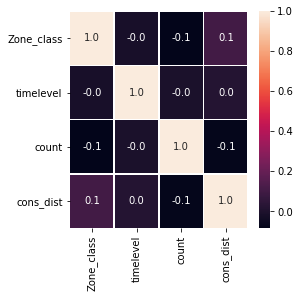

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [27]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df['bs_predict'].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(900, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=550, callbacks=[early_stopping_monitor],batch_size=150)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#


9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
4667    28.0   863.128056          0         0              1    0    1    0   
4063     6.0   777.125665          1         0              0    0    1    0   
856      1.0   330.399145          0         0              1    0    1    0   
5074     8.0   365.388205          0         0              1    0    1    0   
4119    10.0   428.260533          0         0              1    0    0    1   
1545     4.0   420.191763          0         1              0    0    0    0   
3085     3.0   983.141894          1         0              0    0    0    1   
2609     7.0   192.169766          0         0              1    0    1    0   
1894     6.0   849.539347          0         0              1    0    0    0   
693      2.0   499.389405          0         0              1    0    1    0   
4538    15.0   282.206089          1         0              0    0    1    0   
2579    27.0   564.704555          0  

/usr/local/lib/python3.6/dist-packages/keras/callbacks.py:569: RuntimeWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: loss,acc
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


4715/4715 [==============================] - 2s 512us/step - loss: 0.8544 - acc: 0.5839
Epoch 3/550
4715/4715 [==============================] - 2s 410us/step - loss: 0.7911 - acc: 0.5871
Epoch 4/550
4715/4715 [==============================] - 2s 394us/step - loss: 0.7382 - acc: 0.6008
Epoch 5/550
4715/4715 [==============================] - 2s 399us/step - loss: 0.7215 - acc: 0.6125
Epoch 6/550
4715/4715 [==============================] - 2s 398us/step - loss: 0.6977 - acc: 0.6244
Epoch 7/550
4715/4715 [==============================] - 2s 411us/step - loss: 0.6955 - acc: 0.6352
Epoch 8/550
4715/4715 [==============================] - 2s 498us/step - loss: 0.6965 - acc: 0.6363
Epoch 9/550
4715/4715 [==============================] - 2s 406us/step - loss: 0.6704 - acc: 0.6411
Epoch 10/550
4715/4715 [==============================] - 2s 409us/step - loss: 0.6714 - acc: 0.6454
Epoch 11/550
4715/4715 [==============================] - 2s 411us/step - loss: 0.6644 - acc: 0.6399
Epoch 12/5

4715/4715 [==============================] - 2s 389us/step - loss: 0.6186 - acc: 0.6736
Epoch 164/550
4715/4715 [==============================] - 2s 389us/step - loss: 0.6087 - acc: 0.6719
Epoch 165/550
4715/4715 [==============================] - 2s 388us/step - loss: 0.6080 - acc: 0.6776
Epoch 166/550
4715/4715 [==============================] - 2s 388us/step - loss: 0.6088 - acc: 0.6793
Epoch 167/550
4715/4715 [==============================] - 2s 390us/step - loss: 0.6062 - acc: 0.6755
Epoch 168/550
4715/4715 [==============================] - 2s 389us/step - loss: 0.6021 - acc: 0.6776
Epoch 169/550
4715/4715 [==============================] - 2s 388us/step - loss: 0.6155 - acc: 0.6831
Epoch 170/550
4715/4715 [==============================] - 2s 392us/step - loss: 0.6087 - acc: 0.6797
Epoch 171/550
4715/4715 [==============================] - 2s 398us/step - loss: 0.6042 - acc: 0.6744
Epoch 172/550
4715/4715 [==============================] - 2s 394us/step - loss: 0.6031 - acc: 0

4715/4715 [==============================] - 2s 387us/step - loss: 0.5940 - acc: 0.6880
Epoch 324/550
4715/4715 [==============================] - 2s 385us/step - loss: 0.5948 - acc: 0.6836
Epoch 325/550
4715/4715 [==============================] - 2s 388us/step - loss: 0.5998 - acc: 0.6872
Epoch 326/550
4715/4715 [==============================] - 2s 386us/step - loss: 0.5982 - acc: 0.6823
Epoch 327/550
4715/4715 [==============================] - 2s 390us/step - loss: 0.5987 - acc: 0.6842
Epoch 328/550
4715/4715 [==============================] - 2s 387us/step - loss: 0.6017 - acc: 0.6755
Epoch 329/550
4715/4715 [==============================] - 2s 388us/step - loss: 0.5975 - acc: 0.6804
Epoch 330/550
4715/4715 [==============================] - 2s 390us/step - loss: 0.5976 - acc: 0.6836
Epoch 331/550
4715/4715 [==============================] - 2s 389us/step - loss: 0.6003 - acc: 0.6861
Epoch 332/550
4715/4715 [==============================] - 2s 400us/step - loss: 0.5953 - acc: 0

4715/4715 [==============================] - 2s 392us/step - loss: 0.5892 - acc: 0.6929
Epoch 484/550
4715/4715 [==============================] - 2s 386us/step - loss: 0.5838 - acc: 0.6855
Epoch 485/550
4715/4715 [==============================] - 2s 386us/step - loss: 0.5995 - acc: 0.6880
Epoch 486/550
4715/4715 [==============================] - 2s 385us/step - loss: 0.5924 - acc: 0.6836
Epoch 487/550
4715/4715 [==============================] - 2s 387us/step - loss: 0.5974 - acc: 0.6870
Epoch 488/550
4715/4715 [==============================] - 2s 394us/step - loss: 0.5946 - acc: 0.6829
Epoch 489/550
4715/4715 [==============================] - 2s 462us/step - loss: 0.5967 - acc: 0.6842
Epoch 490/550
4715/4715 [==============================] - 2s 408us/step - loss: 0.5887 - acc: 0.6897
Epoch 491/550
4715/4715 [==============================] - 2s 409us/step - loss: 0.5964 - acc: 0.6825
Epoch 492/550
4715/4715 [==============================] - 2s 407us/step - loss: 0.5969 - acc: 0

In [28]:
print(y_test)

      0
3545  0
4706  0
2223  1
4552  1
4404  1
3071  0
3997  1
2328  1
2227  1
1047  1
626   0
5350  1
1926  1
5650  0
1670  1
5247  1
1562  1
5419  1
2664  1
1406  1
1419  0
4012  0
3070  1
1315  1
5479  1
3971  0
808   0
2351  1
4756  0
538   1
...  ..
1789  1
944   0
4686  1
5280  1
12    1
1117  0
4287  0
642   1
1223  0
1370  1
5001  1
4489  1
5785  1
5389  0
4022  1
2549  0
2004  0
2191  1
653   1
429   1
5887  0
1487  1
5845  1
3184  0
2718  1
5620  0
838   0
1087  1
4679  1
1740  0

[1179 rows x 1 columns]


In [29]:
print(predictions)

[[0.16829911]
 [0.8246745 ]
 [0.7086443 ]
 ...
 [0.9318648 ]
 [0.56282437]
 [0.62299013]]


In [41]:
prediction=[]
for x in predictions:
    #print(x)
    k_1=round(x[0])
    k_1_i=int(k_1)
    prediction.append(k_1_i)
    #k_1_s=str(k_1_i)
    #print(k_1_i)
print(prediction)

[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 

In [40]:
actual=y_test.values.tolist()
given=[]
for i in actual:
    given.append(i[0])
print(given)

[0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 

In [45]:
+

9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
4667    28.0   863.128056          0         0              1    0    1    0   
4063     6.0   777.125665          1         0              0    0    1    0   
856      1.0   330.399145          0         0              1    0    1    0   
5074     8.0   365.388205          0         0              1    0    1    0   
4119    10.0   428.260533          0         0              1    0    0    1   
1545     4.0   420.191763          0         1              0    0    0    0   
3085     3.0   983.141894          1         0              0    0    0    1   
2609     7.0   192.169766          0         0              1    0    1    0   
1894     6.0   849.539347          0         0              1    0    0    0   
693      2.0   499.389405          0         0              1    0    1    0   
4538    15.0   282.206089          1         0              0    0    1    0   
2579    27.0   564.704555          0  

KeyboardInterrupt: 

In [9]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df[['bs_predict','latitude','longitude']].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train_k, y_test_k = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
y_train1=y_train_k[0].copy()
y_train=pd.DataFrame(y_train1)
y_test1=y_test_k[0].copy()
y_test=pd.DataFrame(y_test1)

#l=len(y_test_k)
#i=0
lat=y_test_k[1].copy()
lat_l=lat.tolist()

long=y_test_k[2].copy()
long_l=long.tolist()
    

X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(900, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=550, callbacks=[early_stopping_monitor],batch_size=150)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#
prediction=[]
for x in predictions:
    #print(x)
    k_1=round(x[0])
    k_1_i=int(k_1)
    prediction.append(k_1_i)
    #k_1_s=str(k_1_i)
    #print(k_1_i)
#print(prediction)
actual=y_test.values.tolist()
given=[]
for i in actual:
    given.append(i[0])
    
#print(given)
a=confusion_matrix(given,prediction)
print(a)

print(classification_report(given,prediction))
print(accuracy_score(given,prediction))



Using TensorFlow backend.


KeyboardInterrupt: 

In [3]:
print(X)


[['Market' 1 1223 150.45362356746296]
 ['Market' 1 6 894.8104676891829]
 ['Market' 1 5 518.4134835408881]
 ...
 ['Normal city' 3 11 405.4296093697562]
 ['Normal city' 3 11 329.0681838711477]
 ['Highway' 3 270 964.0673129269136]]


In [4]:
X

array([['Market', 1, 1223, 150.45362356746296],
       ['Market', 1, 6, 894.8104676891829],
       ['Market', 1, 5, 518.4134835408881],
       ...,
       ['Normal city', 3, 11, 405.4296093697562],
       ['Normal city', 3, 11, 329.0681838711477],
       ['Highway', 3, 270, 964.0673129269136]], dtype=object)

In [5]:
X_d


,0,1,2,3
0,Market,1,1223,150.454
1,Market,1,6,894.81
2,Market,1,5,518.413
3,Market,1,27,726.193
4,Normal city,1,36,397.128
5,Market,1,8,414.512
6,Market,1,5,377.381
7,Normal city,1,21,1132.24
8,Normal city,1,5,330.237
9,Normal city,1,4,552.449


In [6]:
X_d[0].value_counts()

Normal city    2577
Market         1815
Highway        1502
Name: 0, dtype: int64

In [7]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')


model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist']].values
X_d=pd.DataFrame(X)


y=df[['bs_predict','latitude','longitude']].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train_k, y_test_k = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
y_train1=y_train_k[0].copy()
y_train=pd.DataFrame(y_train1)
y_test1=y_test_k[0].copy()
y_test=pd.DataFrame(y_test1)

#l=len(y_test_k)
#i=0
lat=y_test_k[1].copy()
lat_l=lat.tolist()

long=y_test_k[2].copy()
long_l=long.tolist()
    

X_train_2=pd.get_dummies(X_train,columns=[0,1])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(900, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=550, callbacks=[early_stopping_monitor],batch_size=150)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))
#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#
prediction=[]
for x in predictions:
    #print(x)
    k_1=round(x[0])
    k_1_i=int(k_1)
    prediction.append(k_1_i)
    #k_1_s=str(k_1_i)
    #print(k_1_i)
#print(prediction)
actual=y_test.values.tolist()
given=[]
for i in actual:
    given.append(i[0])
    
#print(given)
a=confusion_matrix(given,prediction)
print(a)

print(classification_report(given,prediction))
print(accuracy_score(given,prediction))



9
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
4667    28.0   863.128056          0         0              1    0    1    0   
4063     6.0   777.125665          1         0              0    0    1    0   
856      1.0   330.399145          0         0              1    0    1    0   
5074     8.0   365.388205          0         0              1    0    1    0   
4119    10.0   428.260533          0         0              1    0    0    1   
1545     4.0   420.191763          0         1              0    0    0    0   
3085     3.0   983.141894          1         0              0    0    0    1   
2609     7.0   192.169766          0         0              1    0    1    0   
1894     6.0   849.539347          0         0              1    0    0    0   
693      2.0   499.389405          0         0              1    0    1    0   
4538    15.0   282.206089          1         0              0    0    1    0   
2579    27.0   564.704555          0  

4715/4715 [==============================] - 2s 368us/step - loss: 0.6134 - acc: 0.6677
Epoch 107/550
4715/4715 [==============================] - 2s 331us/step - loss: 0.6323 - acc: 0.6649
Epoch 108/550
4715/4715 [==============================] - 2s 477us/step - loss: 0.6146 - acc: 0.6710
Epoch 109/550
4715/4715 [==============================] - 3s 566us/step - loss: 0.6074 - acc: 0.6761
Epoch 110/550
4715/4715 [==============================] - 2s 470us/step - loss: 0.6053 - acc: 0.6698
Epoch 111/550
4715/4715 [==============================] - 3s 720us/step - loss: 0.6185 - acc: 0.6698
Epoch 112/550
4715/4715 [==============================] - 3s 605us/step - loss: 0.6155 - acc: 0.6734
Epoch 113/550
4715/4715 [==============================] - 3s 631us/step - loss: 0.6155 - acc: 0.6668
Epoch 114/550
4715/4715 [==============================] - 3s 741us/step - loss: 0.6094 - acc: 0.6687
Epoch 115/550
4715/4715 [==============================] - 3s 736us/step - loss: 0.6134 - acc: 0

4715/4715 [==============================] - 3s 582us/step - loss: 0.6049 - acc: 0.6808
Epoch 267/550
4715/4715 [==============================] - 3s 578us/step - loss: 0.6033 - acc: 0.6806
Epoch 268/550
4715/4715 [==============================] - 3s 578us/step - loss: 0.6053 - acc: 0.6821
Epoch 269/550
4715/4715 [==============================] - 3s 583us/step - loss: 0.5993 - acc: 0.6842
Epoch 270/550
4715/4715 [==============================] - 3s 581us/step - loss: 0.5971 - acc: 0.6840
Epoch 271/550
4715/4715 [==============================] - 3s 582us/step - loss: 0.5987 - acc: 0.6848
Epoch 272/550
4715/4715 [==============================] - 3s 590us/step - loss: 0.5949 - acc: 0.6829
Epoch 273/550
4715/4715 [==============================] - 3s 577us/step - loss: 0.6027 - acc: 0.6795
Epoch 274/550
4715/4715 [==============================] - 3s 583us/step - loss: 0.5971 - acc: 0.6795
Epoch 275/550
4715/4715 [==============================] - 3s 588us/step - loss: 0.6017 - acc: 0

4715/4715 [==============================] - 3s 593us/step - loss: 0.5983 - acc: 0.6931
Epoch 427/550
4715/4715 [==============================] - 3s 574us/step - loss: 0.5913 - acc: 0.6923
Epoch 428/550
4715/4715 [==============================] - 3s 575us/step - loss: 0.5908 - acc: 0.6882
Epoch 429/550
4715/4715 [==============================] - 3s 576us/step - loss: 0.5962 - acc: 0.6836
Epoch 430/550
4715/4715 [==============================] - 3s 575us/step - loss: 0.5962 - acc: 0.6908
Epoch 431/550
4715/4715 [==============================] - 3s 583us/step - loss: 0.5978 - acc: 0.6814
Epoch 432/550
4715/4715 [==============================] - 3s 590us/step - loss: 0.5911 - acc: 0.6876
Epoch 433/550
4715/4715 [==============================] - 3s 578us/step - loss: 0.5950 - acc: 0.6893
Epoch 434/550
4715/4715 [==============================] - 3s 583us/step - loss: 0.5875 - acc: 0.6914
Epoch 435/550
4715/4715 [==============================] - 3s 579us/step - loss: 0.5923 - acc: 0

In [19]:
import os
import pandas
import sys


	#df=pd.read_csv(name)

text=open('map_azone.txt','r')
read=text.readlines()
#print(read)
v=[]

l=len(read)

i=0

while i<l:
    line=read[i].split(' ')
    
    print(line)
    i+=4

['<?xml', 'version="1.0"', 'encoding="UTF-8"?>\n']
['\n']
['', '', '', '', '<tag', 'k="railway"', 'v="station"/>\n']
['', '', '<node', 'id="252586790"', 'lat="23.5100953"', 'lon="87.2889864"', 'version="4"', 'timestamp="2015-10-04T06:18:30Z"', 'changeset="34420220"', 'uid="404532"', 'user="jaimemd"/>\n']
['', '', '', '', '<tag', 'k="created_by"', 'v="JOSM"/>\n']
['', '', '', '', '<tag', 'k="created_by"', 'v="JOSM"/>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="bus_stop"/>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="bus_stop"/>\n']
['', '', '<node', 'id="304985571"', 'lat="23.5012913"', 'lon="87.3045434"', 'version="5"', 'timestamp="2011-06-21T22:32:11Z"', 'changeset="8509575"', 'uid="56597"', 'user="Oberaffe"/>\n']
['', '', '', '', '<tag', 'k="amenity"', 'v="bus_station"/>\n']
['', '', '', '', '<tag', 'k="source"', 'v="Bing"/>\n']
['', '', '</node>\n']
['', '', '<node', 'id="582022291"', 'lat="23.6259058"', 'lon="86.9642218"', 'version="1"', 'timestamp="2009-12-05T17:50:50Z"', '

['', '', '<node', 'id="1334005020"', 'lat="23.5089328"', 'lon="87.3007339"', 'version="1"', 'timestamp="2011-06-21T21:31:22Z"', 'changeset="8509118"', 'uid="56597"', 'user="Oberaffe"/>\n']
['', '', '<node', 'id="1334005024"', 'lat="23.5092308"', 'lon="87.3102750"', 'version="1"', 'timestamp="2011-06-21T21:31:22Z"', 'changeset="8509118"', 'uid="56597"', 'user="Oberaffe"/>\n']
['', '', '', '', '<tag', 'k="power"', 'v="tower"/>\n']
['', '', '<node', 'id="1334005030"', 'lat="23.5095895"', 'lon="87.3042140"', 'version="1"', 'timestamp="2011-06-21T21:31:22Z"', 'changeset="8509118"', 'uid="56597"', 'user="Oberaffe"/>\n']
['', '', '<node', 'id="1334005034"', 'lat="23.5097165"', 'lon="87.3103018"', 'version="1"', 'timestamp="2011-06-21T21:31:22Z"', 'changeset="8509118"', 'uid="56597"', 'user="Oberaffe"/>\n']
['', '', '<node', 'id="1334005038"', 'lat="23.5108475"', 'lon="87.3105664"', 'version="1"', 'timestamp="2011-06-21T21:31:22Z"', 'changeset="8509118"', 'uid="56597"', 'user="Oberaffe"/>\n']


['', '', '<node', 'id="3633610216"', 'lat="23.5523648"', 'lon="87.3120793"', 'version="1"', 'timestamp="2015-07-03T23:06:58Z"', 'changeset="32400618"', 'uid="380996"', 'user="Enzet"/>\n']
['', '', '<node', 'id="3633610220"', 'lat="23.5523673"', 'lon="87.3127568"', 'version="1"', 'timestamp="2015-07-03T23:06:58Z"', 'changeset="32400618"', 'uid="380996"', 'user="Enzet"/>\n']
['', '', '<node', 'id="3633610224"', 'lat="23.5523723"', 'lon="87.3119162"', 'version="1"', 'timestamp="2015-07-03T23:06:58Z"', 'changeset="32400618"', 'uid="380996"', 'user="Enzet"/>\n']
['', '', '<node', 'id="3633610230"', 'lat="23.5523783"', 'lon="87.3117298"', 'version="1"', 'timestamp="2015-07-03T23:06:58Z"', 'changeset="32400618"', 'uid="380996"', 'user="Enzet"/>\n']
['', '', '<node', 'id="3633610238"', 'lat="23.5523824"', 'lon="87.3116048"', 'version="1"', 'timestamp="2015-07-03T23:06:58Z"', 'changeset="32400618"', 'uid="380996"', 'user="Enzet"/>\n']
['', '', '<node', 'id="3633610242"', 'lat="23.5523837"', 'lo

['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1330919585"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1330920845"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1330920630"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1330918448"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1330919824"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1330918583"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1330920559"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', '

['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1331354876"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1331357761"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1331356895"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1331357357"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1331354580"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1331357118"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', 'v="living_street"/>\n']
['', '', '', '', '<nd', 'ref="1331355531"/>\n']
['', '', '</way>\n']
['', '', '', '', '<tag', 'k="highway"', '

['', '', '', '', '<nd', 'ref="3633313888"/>\n']
['', '', '', '', '<tag', 'k="building"', 'v="yes"/>\n']
['', '', '', '', '<nd', 'ref="3633313716"/>\n']
['', '', '', '', '<tag', 'k="building"', 'v="yes"/>\n']
['', '', '', '', '<nd', 'ref="3633314350"/>\n']
['', '', '', '', '<tag', 'k="building"', 'v="yes"/>\n']
['', '', '', '', '<nd', 'ref="3633313884"/>\n']
['', '', '', '', '<tag', 'k="building"', 'v="yes"/>\n']
['', '', '', '', '<nd', 'ref="3633313990"/>\n']
['', '', '', '', '<tag', 'k="building"', 'v="yes"/>\n']
['', '', '', '', '<nd', 'ref="3633312638"/>\n']
['', '', '', '', '<tag', 'k="building"', 'v="yes"/>\n']
['', '', '', '', '<nd', 'ref="3633313954"/>\n']
['', '', '', '', '<tag', 'k="building"', 'v="yes"/>\n']
['', '', '', '', '<nd', 'ref="3633313745"/>\n']
['', '', '', '', '<tag', 'k="building"', 'v="yes"/>\n']
['', '', '', '', '<nd', 'ref="3633313840"/>\n']
['', '', '', '', '<tag', 'k="building"', 'v="yes"/>\n']
['', '', '', '', '<nd', 'ref="3633314308"/>\n']
['', '', '', '',

['', '', '', '', '<nd', 'ref="3634100678"/>\n']
['', '', '<way', 'id="358499047"', 'version="1"', 'timestamp="2015-07-04T10:56:31Z"', 'changeset="32406839"', 'uid="380996"', 'user="Enzet">\n']
['', '', '', '', '<nd', 'ref="3634100664"/>\n']
['', '', '<way', 'id="358499048"', 'version="1"', 'timestamp="2015-07-04T10:56:31Z"', 'changeset="32406839"', 'uid="380996"', 'user="Enzet">\n']
['', '', '', '', '<nd', 'ref="3634100401"/>\n']
['', '', '<way', 'id="358499049"', 'version="1"', 'timestamp="2015-07-04T10:56:31Z"', 'changeset="32406839"', 'uid="380996"', 'user="Enzet">\n']
['', '', '', '', '<nd', 'ref="3634100418"/>\n']
['', '', '<way', 'id="358499050"', 'version="1"', 'timestamp="2015-07-04T10:56:31Z"', 'changeset="32406839"', 'uid="380996"', 'user="Enzet">\n']
['', '', '', '', '<nd', 'ref="3634100539"/>\n']
['', '', '<way', 'id="358499051"', 'version="1"', 'timestamp="2015-07-04T10:56:31Z"', 'changeset="32406839"', 'uid="380996"', 'user="Enzet">\n']
['', '', '', '', '<nd', 'ref="36341

['', '', '', '', '<member', 'type="way"', 'ref="110802041"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="26684942"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="27123729"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="361582590"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="26659704"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="26662245"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="42777065"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="87385519"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="387687048"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="206020078"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="96330901"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="96115497"', 'role=""/>\n']
['', '', '', '', '<member', 'type="way"', 'ref="96115415"', 'role=""/>\n']
['', '', '', '', '<me

In [7]:
print("a")

a


In [20]:
import os
import pandas
import sys

def type_road():
	#df=pd.read_csv(name)

	text=open('map_azone.txt','r')
	read=text.readlines()
	v=[]

	l=len(read)

	i=0

	while i<l:
		line=read[i].split(' ')
		for k in line:
			print(k)
			print("k")
			if 'way' not in k or '/way' in k:
				break
			else:
				print("l")
				if 'id=' in k:
					l1=len(k)-2
					k1=k[5:l1]

					while '<tag k="highway"' in read[i]:
						i+=1
					line2=read[i].split(' ')
					for l in l2:
						if 'highway' in l:
							if 'v=' in l:
								l2=len(l)-6
								p1=l[4:l2]
					print(k1," ",p1)
					v.append({k1:p1})
		i+=1

	print(v)

def main():
	type_road()

main()

<?xml
k
<osm
k
<note>The
k
<meta
k


k

k


k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k


k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k


k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k



k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k


k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k



k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k


k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k




k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k



k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k


k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k



k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k


k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k



k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k


k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k



k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k


k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k




k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k



k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k


k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k

k



In [2]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')
#df=df1[df1.Zone=='Normal city']

model=Sequential()
print(df)

#TRain
X=df[['Zone_class','timelevel','count','cons_dist','Population_class','Speed']]
#X_d=pd.DataFrame(X)


       latitude  longitude time-stamp  count  trail_number  \
0     23.564328  87.282937   08:27:33   1223             1   
1     23.572243  87.281352   08:38:31      6             1   
2     23.573663  87.276507   08:40:15      5             1   
3     23.579585  87.273502   08:42:00     27             1   
4     23.582282  87.276057   08:43:57     36             1   
5     23.580257  87.279472   08:45:28      8             1   
6     23.578630  87.282722   08:46:27      5             1   
7     23.588792  87.282012   08:49:40     21             1   
8     23.590542  87.284630   08:50:48      5             1   
9     23.586373  87.287580   08:51:58      4             1   
10    23.580067  87.287470   08:53:33     11             1   
11    23.579295  87.291565   08:54:53      4             1   
12    23.574998  87.291477   08:56:07     10             1   
13    23.574172  87.295698   08:57:40      7             1   
14    23.574110  87.299222   08:58:43     79             1   
15    23

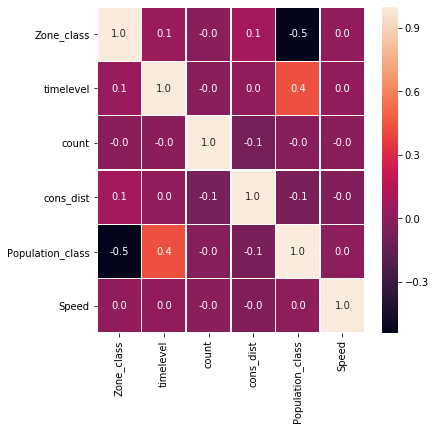

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(6, 6))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [4]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')
#df=df1[df1.Zone=='Normal city']

model=Sequential()
print(df)

#TRain
X=df[['Zone_class','timelevel','count','cons_dist','Population_class']]
#X_d=pd.DataFrame(X)


        latitude  longitude time-stamp  count  trail_number  \
0      23.564248  87.282713   05:18:51   2042             8   
1      23.564212  87.282925   05:36:59    431             4   
2      23.564335  87.282648   05:42:57    866            25   
3      23.563943  87.283853   05:49:28      4             8   
4      23.564432  87.282388   05:49:35    633             4   
5      23.564262  87.282958   05:50:21     22             8   
6      23.564403  87.282422   05:51:29    423             8   
7      23.564358  87.282502   05:51:38    931            18   
8      23.564248  87.282763   05:54:23    922            16   
9      23.564013  87.283902   05:55:30      6            25   
10     23.564028  87.281493   05:59:04      1             8   
11     23.563833  87.281183   05:59:15      6             4   
12     23.564387  87.282357   05:59:33     76            16   
13     23.563570  87.280762   05:59:42     14             4   
14     23.562732  87.279345   06:00:41    190          

KeyError: "['Population_class'] not in index"

NameError: name 'X' is not defined

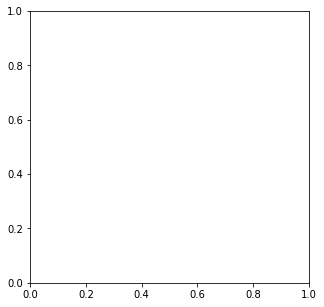

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(5, 5))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [11]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix,matthews_corrcoef
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')

model=Sequential()
#print(len(df))

#TRain
X=df[['Zone','timelevel','count','cons_dist','Population_density']].values
X_d=pd.DataFrame(X)


y=df[['bs_predict','latitude','longitude']].values
y_d=pd.DataFrame(y)
y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train_k, y_test_k = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
#print(X_train)
y_train1=y_train_k[0].copy()
y_train=pd.DataFrame(y_train1)
y_test1=y_test_k[0].copy()
y_test=pd.DataFrame(y_test1)

#l=len(y_test_k)
#i=0
lat=y_test_k[1].copy()
lat_l=lat.tolist()

long=y_test_k[2].copy()
long_l=long.tolist()
    

X_train_2=pd.get_dummies(X_train,columns=[0,1,4])
#X_train_2[1] = X_train_2[1].astype(float)
X_train_2[2] = X_train_2[2].astype(float)
X_train_2[3] = X_train_2[3].astype(float)
#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1,4])
#X_test_2[1] = X_test_2[1].astype(float)
X_test_2[2] = X_test_2[2].astype(float)
X_test_2[3] = X_test_2[3].astype(float)
#y_test_2=pd.get_dummies(y_test)
n_cols=X_train_2.shape[1]
print(n_cols)
print(X_train_2)
model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.1))

'''model.add(Dense(200, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(400, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))'''
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
'''model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))'''
model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1000, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))

early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
from keras.optimizers import SGD
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer='Adagrad', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=500, callbacks=[early_stopping_monitor],batch_size=120)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))

text=open('total_accuracy','w')
text.write("test="+str(scores[1]*100)+"\n")
text.write("train="+str(scores_2[1]*100)+"\n")
text.close()

#value_check=new_y.tolist()
#print(value_check)
#print(value_check)

#---------------------#
#new_y_d=pd.DataFrame(new_y)
#----------------------#
prediction=[]
for x in predictions:
    #print(x)
    k_1=round(x[0])
    k_1_i=int(k_1)
    prediction.append(k_1_i)
    #k_1_s=str(k_1_i)
    #print(k_1_i)
#print(prediction)
actual=y_test.values.tolist()
given=[]
for i in actual:
    given.append(i[0])
#print(given)

text_fp=open('False_Positive.csv','w')
text_fp.write('latitude,longitude\n')

text_fn=open('False_Negative.csv','w')
text_fn.write('latitude,longitude\n')

text_tp=open('True_Positive.csv','w')
text_tp.write('latitude,longitude\n')

text_tn=open('True_Negative.csv','w')
text_tn.write('latitude,longitude\n')

l=len(y_test)
j=0

while j<l:
    if given[j]==1 and prediction[j]==0:
        text_fn.write(str(lat_l[j])+","+str(long_l[j])+"\n")
    if given[j]==0 and prediction[j]==1:
        text_fp.write(str(lat_l[j])+","+str(long_l[j])+"\n")
    if given[j]==1 and prediction[j]==1:
        text_tp.write(str(lat_l[j])+","+str(long_l[j])+"\n")
    if given[j]==0 and prediction[j]==0:
        text_tn.write(str(lat_l[j])+","+str(long_l[j])+"\n")
    j+=1

text_fn.close()
text_fp.close()
text_tp.close()
text_tn.close()

print(matthews_corrcoef(given,prediction))
print(confusion_matrix(given,prediction))
print(classification_report(given,prediction))
    

12
           2            3  0_Highway  0_Market  0_Normal city  1_1  1_2  1_3  \
288     12.0  1406.463171          0         1              0    0    1    0   
2620    27.0   110.472442          1         0              0    0    0    0   
6452     8.0   249.519924          0         1              0    0    1    0   
3671     6.0   442.383655          0         1              0    0    1    0   
7947     9.0  1290.220278          0         0              1    0    1    0   
6037    98.0  1572.366966          0         0              1    0    0    1   
388      2.0    64.710805          0         1              0    0    1    0   
836    284.0    95.963782          0         1              0    0    0    1   
6872     3.0   349.567533          0         1              0    0    0    0   
4102    14.0   237.258482          0         1              0    0    1    0   
280     15.0   187.993943          0         1              0    0    1    0   
6757     6.0  1310.603392          0 

Epoch 7/500
9590/9590 [==============================] - 3s 261us/step - loss: 0.6935 - acc: 0.5665
Epoch 8/500
9590/9590 [==============================] - 3s 262us/step - loss: 0.6885 - acc: 0.5656
Epoch 9/500
9590/9590 [==============================] - 3s 262us/step - loss: 0.6901 - acc: 0.5617
Epoch 10/500
9590/9590 [==============================] - 3s 263us/step - loss: 0.6892 - acc: 0.5659
Epoch 11/500
9590/9590 [==============================] - 2s 259us/step - loss: 0.6887 - acc: 0.5629
Epoch 12/500
9590/9590 [==============================] - 3s 262us/step - loss: 0.6865 - acc: 0.5638
Epoch 13/500
9590/9590 [==============================] - 3s 262us/step - loss: 0.6852 - acc: 0.5687
Epoch 14/500
9590/9590 [==============================] - 2s 260us/step - loss: 0.6879 - acc: 0.5620
Epoch 15/500
9590/9590 [==============================] - 3s 261us/step - loss: 0.6851 - acc: 0.5667
Epoch 16/500
9590/9590 [==============================] - 3s 262us/step - loss: 0.6854 - acc: 

9590/9590 [==============================] - 3s 262us/step - loss: 0.6525 - acc: 0.5953
Epoch 169/500
9590/9590 [==============================] - 3s 262us/step - loss: 0.6526 - acc: 0.5993
Epoch 170/500
9590/9590 [==============================] - 3s 261us/step - loss: 0.6527 - acc: 0.6028
Epoch 171/500
9590/9590 [==============================] - 3s 265us/step - loss: 0.6512 - acc: 0.6006
Epoch 172/500
9590/9590 [==============================] - 3s 263us/step - loss: 0.6527 - acc: 0.5993
Epoch 173/500
9590/9590 [==============================] - 3s 264us/step - loss: 0.6521 - acc: 0.5993
Epoch 174/500
9590/9590 [==============================] - 3s 263us/step - loss: 0.6536 - acc: 0.5982
Epoch 175/500
9590/9590 [==============================] - 3s 265us/step - loss: 0.6516 - acc: 0.5909
Epoch 176/500
9590/9590 [==============================] - 2s 261us/step - loss: 0.6564 - acc: 0.5934
Epoch 177/500
9590/9590 [==============================] - 3s 264us/step - loss: 0.6537 - acc: 0

9590/9590 [==============================] - 3s 264us/step - loss: 0.6428 - acc: 0.6057
Epoch 329/500
9590/9590 [==============================] - 3s 263us/step - loss: 0.6422 - acc: 0.6104
Epoch 330/500
9590/9590 [==============================] - 3s 263us/step - loss: 0.6436 - acc: 0.6102
Epoch 331/500
9590/9590 [==============================] - 3s 263us/step - loss: 0.6426 - acc: 0.6122
Epoch 332/500
9590/9590 [==============================] - 3s 264us/step - loss: 0.6420 - acc: 0.6144
Epoch 333/500
9590/9590 [==============================] - 3s 264us/step - loss: 0.6428 - acc: 0.6138
Epoch 334/500
9590/9590 [==============================] - 3s 264us/step - loss: 0.6395 - acc: 0.6160
Epoch 335/500
9590/9590 [==============================] - 3s 264us/step - loss: 0.6409 - acc: 0.6135
Epoch 336/500
9590/9590 [==============================] - 3s 264us/step - loss: 0.6437 - acc: 0.6121
Epoch 337/500
9590/9590 [==============================] - 3s 264us/step - loss: 0.6433 - acc: 0

9590/9590 [==============================] - 3s 264us/step - loss: 0.6366 - acc: 0.6130
Epoch 489/500
9590/9590 [==============================] - 2s 260us/step - loss: 0.6337 - acc: 0.6211
Epoch 490/500
9590/9590 [==============================] - 3s 263us/step - loss: 0.6355 - acc: 0.6226
Epoch 491/500
9590/9590 [==============================] - 3s 262us/step - loss: 0.6375 - acc: 0.6141
Epoch 492/500
9590/9590 [==============================] - 3s 264us/step - loss: 0.6344 - acc: 0.6245
Epoch 493/500
9590/9590 [==============================] - 3s 264us/step - loss: 0.6353 - acc: 0.6211
Epoch 494/500
9590/9590 [==============================] - 3s 263us/step - loss: 0.6355 - acc: 0.6194
Epoch 495/500
9590/9590 [==============================] - 3s 265us/step - loss: 0.6356 - acc: 0.6242
Epoch 496/500
9590/9590 [==============================] - 3s 263us/step - loss: 0.6340 - acc: 0.6220
Epoch 497/500
9590/9590 [==============================] - 3s 265us/step - loss: 0.6327 - acc: 0

In [7]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('details_final.csv')
#df=df1[df1.Zone=='Normal city']

model=Sequential()
print(df)

#TRain
X=df[['Zone_class','timelevel','count','cons_dist','Population_class']]
#X_d=pd.DataFrame(X)

       latitude  longitude time-stamp  count  trail_number  \
0     23.564328  87.282937   08:27:33   1223             1   
1     23.572243  87.281352   08:38:31      6             1   
2     23.573663  87.276507   08:40:15      5             1   
3     23.579585  87.273502   08:42:00     27             1   
4     23.582282  87.276057   08:43:57     36             1   
5     23.580257  87.279472   08:45:28      8             1   
6     23.578630  87.282722   08:46:27      5             1   
7     23.588792  87.282012   08:49:40     21             1   
8     23.590542  87.284630   08:50:48      5             1   
9     23.586373  87.287580   08:51:58      4             1   
10    23.580067  87.287470   08:53:33     11             1   
11    23.579295  87.291565   08:54:53      4             1   
12    23.574998  87.291477   08:56:07     10             1   
13    23.574172  87.295698   08:57:40      7             1   
14    23.574110  87.299222   08:58:43     79             1   
15    23

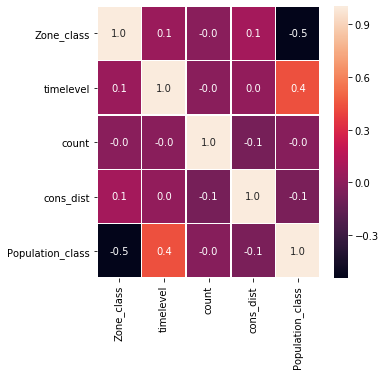

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(5, 5))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [1]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

model=Sequential()
print(df)

#TRain
X=df[['zone','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_density','rsi','Weekend/day']]
#X_d=pd.DataFrame(X)

Using TensorFlow backend.


       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

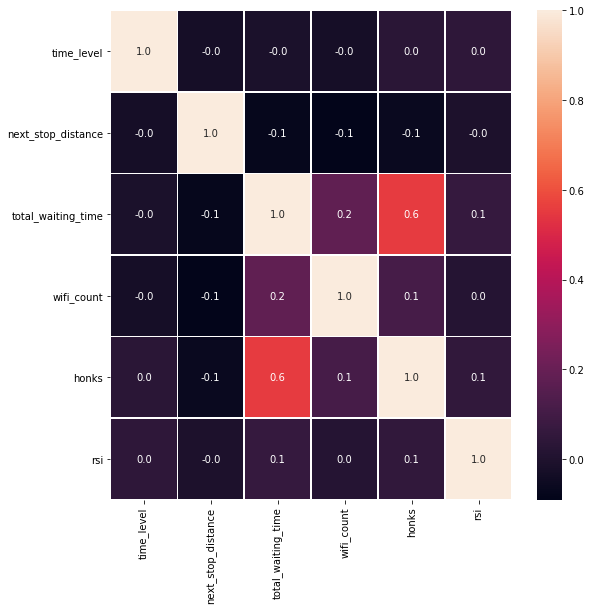

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(9, 9))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [4]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

model=Sequential()
print(df)

#TRain
X=df[['zone','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_density','rsi','Weekend/day','bus_stop']]
#X_d=pd.DataFrame(X)

       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

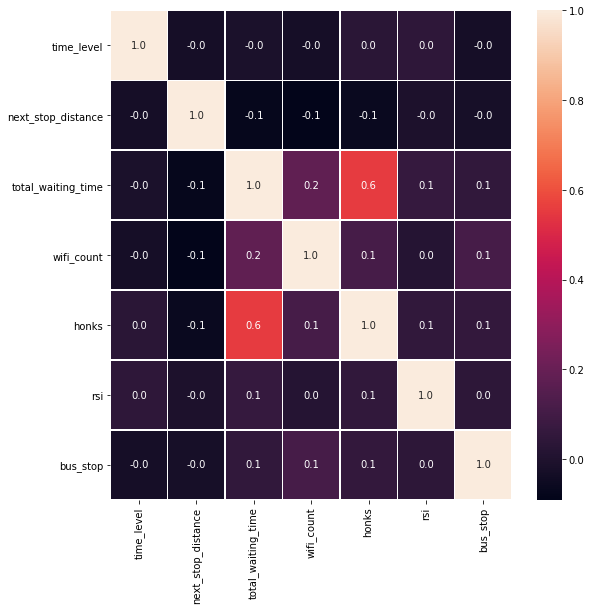

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(9, 9))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [11]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

#model=Sequential()
print(df)

#TRain
X=df[['zone','time_level','bus_stop']]
X_d=pd.DataFrame(X)
print(X_d)

       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

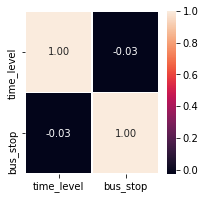

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(3, 3))
sns.heatmap(X_d.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

In [16]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

#model=Sequential()
print(df)

#TRain
X=df[['time_level','zone','bus_stop']]
X_d=pd.DataFrame(X)
print(X_d)

       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

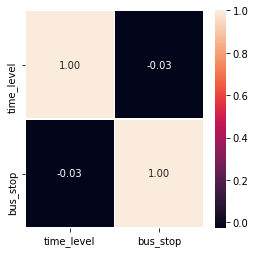

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

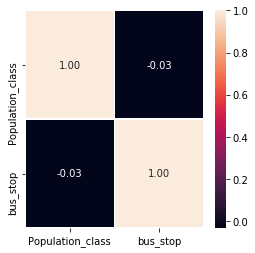

In [24]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

#model=Sequential()
print(df)

#TRain
X=df[['Population_class','bus_stop']]
X_d=pd.DataFrame(X)
print(X_d)
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(X_d.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

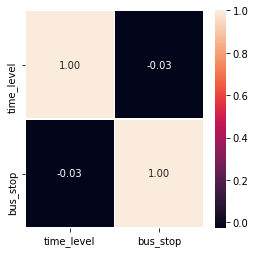

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(X_d.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

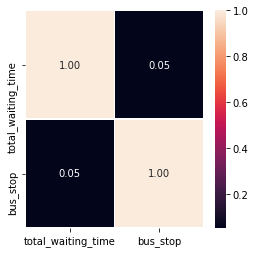

In [25]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

#model=Sequential()
print(df)

#TRain
X=df[['total_waiting_time','bus_stop']]
X_d=pd.DataFrame(X)
print(X_d)
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(X_d.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

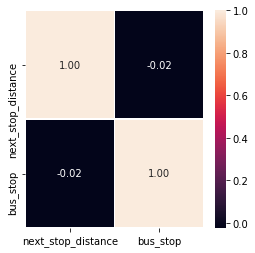

In [26]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

#model=Sequential()
print(df)

#TRain
X=df[['next_stop_distance','bus_stop']]
X_d=pd.DataFrame(X)
print(X_d)
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(X_d.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

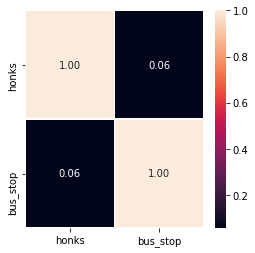

In [28]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

#model=Sequential()
print(df)

#TRain
X=df[['honks','bus_stop']]
X_d=pd.DataFrame(X)
print(X_d)
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(X_d.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

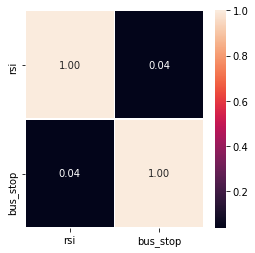

In [29]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

#model=Sequential()
print(df)

#TRain
X=df[['rsi','bus_stop']]
X_d=pd.DataFrame(X)
print(X_d)
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(X_d.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

In [1]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

model=Sequential()
print(df)

#TRain
X=df[['zone','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_density','rsi','Weekend/day','bus_stop']]
#X_d=pd.DataFrame(X)

Using TensorFlow backend.


       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

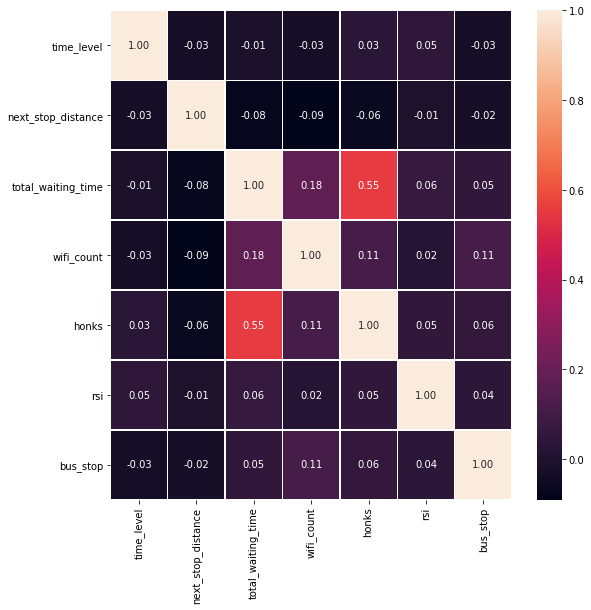

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(9, 9))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

       latitude  longitude        date time-stamp  total_waiting_time  \
0     23.494307  87.317179  06/30/2019   08:03:00                  29   
1     23.494090  87.317059  06/30/2019   08:03:51                   3   
2     23.493723  87.316833  06/30/2019   08:04:22                   3   
3     23.493575  87.316755  06/30/2019   08:04:38                  21   
4     23.493259  87.316509  06/30/2019   08:06:20                  39   
5     23.493258  87.316301  06/30/2019   08:06:56                   8   
6     23.496423  87.313620  06/30/2019   08:08:31                   2   
7     23.503296  87.307436  06/30/2019   08:13:31                   7   
8     23.528323  87.311031  06/30/2019   08:21:07                   7   
9     23.533299  87.306547  06/30/2019   08:22:33                   3   
10    23.536927  87.301655  06/30/2019   08:23:57                   3   
11    23.535118  87.297499  06/30/2019   08:26:03                  24   
12    23.537718  87.296707  06/30/2019   08:27:42  

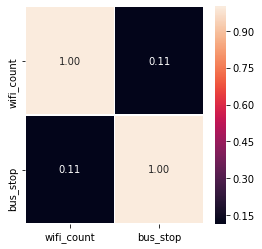

In [2]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from keras.layers.normalization import BatchNormalization


df=pd.read_csv('feature.csv')
#df=df1[df1.Zone=='Normal city']

#model=Sequential()
print(df)

#TRain
X=df[['wifi_count','bus_stop']]
X_d=pd.DataFrame(X)
print(X_d)
import seaborn as sns
import matplotlib.pyplot as plt
#correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(X_d.corr(), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

In [1]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from keras.layers.normalization import BatchNormalization
from sklearn.metrics import accuracy_score


df=pd.read_csv('feature.csv')

df.info()
model=Sequential()
#print(len(df))

#TRain
X=df[['zone','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_density','rsi','Weekend/day']].values
X_d=pd.DataFrame(X)
#X_d_2=pd.get_dummies(X_d)

y=df['bus_stop'].values
y_d=pd.DataFrame(y)
#y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1,6,8])
#X_train_2[1] = X_train_2[1].astype(float)

#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1,6,8])
#X_test_2[1] = X_test_2[1].astype(float)

#y_test_2=pd.get_dummies(y_test)
#n_cols=X_train_2.shape[1]
n_cols=X_train_2.shape[1]
print(n_cols)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(200, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(400, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

'''model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))'''
model.add(Dense(700, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))


early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=400, callbacks=[early_stopping_monitor],batch_size=100)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))


Using TensorFlow backend.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1682 entries, 0 to 1681
Data columns (total 20 columns):
latitude               1682 non-null float64
longitude              1682 non-null float64
date                   1682 non-null object
time-stamp             1682 non-null object
total_waiting_time     1682 non-null int64
trail_number           1682 non-null int64
local_group_number     1682 non-null int64
group_starting_time    1682 non-null object
group_ending_time      1682 non-null object
next_stop_distance     1682 non-null float64
time_level             1682 non-null int64
zone                   1682 non-null object
Day                    1682 non-null object
wifi_count             1682 non-null int64
honks                  1682 non-null int64
rsi                    1682 non-null float64
bus_stop               1682 non-null int64
Weekend/day            1682 non-null object
Population_density     1682 non-null object
Population_class       1682 non-null int64
dtypes: float64(4

/usr/local/lib/python3.6/dist-packages/keras/callbacks.py:569: RuntimeWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: loss,acc
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


1345/1345 [==============================] - 1s 421us/step - loss: 0.9476 - acc: 0.5375
Epoch 3/400
1345/1345 [==============================] - 1s 405us/step - loss: 0.9315 - acc: 0.5651
Epoch 4/400
1345/1345 [==============================] - 1s 393us/step - loss: 0.9026 - acc: 0.5606
Epoch 5/400
1345/1345 [==============================] - 1s 463us/step - loss: 0.8125 - acc: 0.5665
Epoch 6/400
1345/1345 [==============================] - 1s 564us/step - loss: 0.8289 - acc: 0.5725
Epoch 7/400
1345/1345 [==============================] - 1s 408us/step - loss: 0.8062 - acc: 0.5881
Epoch 8/400
1345/1345 [==============================] - 1s 400us/step - loss: 0.7943 - acc: 0.5784
Epoch 9/400
1345/1345 [==============================] - 1s 528us/step - loss: 0.7667 - acc: 0.5836
Epoch 10/400
1345/1345 [==============================] - 1s 448us/step - loss: 0.7149 - acc: 0.5993
Epoch 11/400
1345/1345 [==============================] - 1s 468us/step - loss: 0.7428 - acc: 0.5822
Epoch 12/4

1345/1345 [==============================] - 0s 336us/step - loss: 0.5745 - acc: 0.6788
Epoch 164/400
1345/1345 [==============================] - 0s 334us/step - loss: 0.5795 - acc: 0.6810
Epoch 165/400
1345/1345 [==============================] - 0s 333us/step - loss: 0.5800 - acc: 0.6751
Epoch 166/400
1345/1345 [==============================] - 0s 336us/step - loss: 0.5742 - acc: 0.6944
Epoch 167/400
1345/1345 [==============================] - 0s 336us/step - loss: 0.5770 - acc: 0.6989
Epoch 168/400
1345/1345 [==============================] - 0s 337us/step - loss: 0.5710 - acc: 0.6833
Epoch 169/400
1345/1345 [==============================] - 0s 339us/step - loss: 0.5761 - acc: 0.6840
Epoch 170/400
1345/1345 [==============================] - 0s 338us/step - loss: 0.5902 - acc: 0.6520
Epoch 171/400
1345/1345 [==============================] - 0s 338us/step - loss: 0.5780 - acc: 0.6818
Epoch 172/400
1345/1345 [==============================] - 0s 336us/step - loss: 0.5746 - acc: 0

1345/1345 [==============================] - 0s 343us/step - loss: 0.5211 - acc: 0.7309
Epoch 324/400
1345/1345 [==============================] - 0s 338us/step - loss: 0.5168 - acc: 0.7331
Epoch 325/400
1345/1345 [==============================] - 0s 337us/step - loss: 0.5237 - acc: 0.7420
Epoch 326/400
1345/1345 [==============================] - 0s 336us/step - loss: 0.5198 - acc: 0.7279
Epoch 327/400
1345/1345 [==============================] - 0s 333us/step - loss: 0.5245 - acc: 0.7301
Epoch 328/400
1345/1345 [==============================] - 0s 334us/step - loss: 0.5207 - acc: 0.7368
Epoch 329/400
1345/1345 [==============================] - 0s 337us/step - loss: 0.5115 - acc: 0.7435
Epoch 330/400
1345/1345 [==============================] - 0s 337us/step - loss: 0.5162 - acc: 0.7309
Epoch 331/400
1345/1345 [==============================] - 0s 337us/step - loss: 0.5127 - acc: 0.7353
Epoch 332/400
1345/1345 [==============================] - 0s 335us/step - loss: 0.5279 - acc: 0

In [2]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from keras.layers.normalization import BatchNormalization
from sklearn.metrics import accuracy_score


df=pd.read_csv('feature.csv')

df.info()
model=Sequential()
#print(len(df))

#TRain
X=df[['zone','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_density','rsi','Weekend/day']].values
X_d=pd.DataFrame(X)
#X_d_2=pd.get_dummies(X_d)

y=df['bus_stop'].values
y_d=pd.DataFrame(y)
#y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1,6,8])
#X_train_2[1] = X_train_2[1].astype(float)

#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1,6,8])
#X_test_2[1] = X_test_2[1].astype(float)

#y_test_2=pd.get_dummies(y_test)
#n_cols=X_train_2.shape[1]
n_cols=X_train_2.shape[1]
print(n_cols)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(200, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(400, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

'''model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))'''
model.add(Dense(700, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))


early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=400, callbacks=[early_stopping_monitor],batch_size=100)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1682 entries, 0 to 1681
Data columns (total 20 columns):
latitude               1682 non-null float64
longitude              1682 non-null float64
date                   1682 non-null object
time-stamp             1682 non-null object
total_waiting_time     1682 non-null int64
trail_number           1682 non-null int64
local_group_number     1682 non-null int64
group_starting_time    1682 non-null object
group_ending_time      1682 non-null object
next_stop_distance     1682 non-null float64
time_level             1682 non-null int64
zone                   1682 non-null object
Day                    1682 non-null object
wifi_count             1682 non-null int64
honks                  1682 non-null int64
rsi                    1682 non-null float64
bus_stop               1682 non-null int64
Weekend/day            1682 non-null object
Population_density     1682 non-null object
Population_class       1682 non-null int64
dtypes: float64(4

1345/1345 [==============================] - 0s 287us/step - loss: 0.5430 - acc: 0.7033
Epoch 109/400
1345/1345 [==============================] - 0s 283us/step - loss: 0.5597 - acc: 0.6981
Epoch 110/400
1345/1345 [==============================] - 0s 287us/step - loss: 0.5524 - acc: 0.7011
Epoch 111/400
1345/1345 [==============================] - 0s 285us/step - loss: 0.5563 - acc: 0.6914
Epoch 112/400
1345/1345 [==============================] - 0s 286us/step - loss: 0.5579 - acc: 0.6937
Epoch 113/400
1345/1345 [==============================] - 0s 287us/step - loss: 0.5520 - acc: 0.7026
Epoch 114/400
1345/1345 [==============================] - 0s 287us/step - loss: 0.5419 - acc: 0.7160
Epoch 115/400
1345/1345 [==============================] - 0s 284us/step - loss: 0.5602 - acc: 0.6944
Epoch 116/400
1345/1345 [==============================] - 0s 284us/step - loss: 0.5322 - acc: 0.7249
Epoch 117/400
1345/1345 [==============================] - 0s 287us/step - loss: 0.5442 - acc: 0

1345/1345 [==============================] - 0s 289us/step - loss: 0.4755 - acc: 0.7717
Epoch 269/400
1345/1345 [==============================] - 0s 289us/step - loss: 0.4876 - acc: 0.7546
Epoch 270/400
1345/1345 [==============================] - 0s 288us/step - loss: 0.4763 - acc: 0.7509
Epoch 271/400
1345/1345 [==============================] - 0s 286us/step - loss: 0.4749 - acc: 0.7539
Epoch 272/400
1345/1345 [==============================] - 0s 285us/step - loss: 0.4924 - acc: 0.7532
Epoch 273/400
1345/1345 [==============================] - 0s 288us/step - loss: 0.4849 - acc: 0.7524
Epoch 274/400
1345/1345 [==============================] - 0s 289us/step - loss: 0.4812 - acc: 0.7546
Epoch 275/400
1345/1345 [==============================] - 0s 287us/step - loss: 0.4694 - acc: 0.7509
Epoch 276/400
1345/1345 [==============================] - 0s 285us/step - loss: 0.4728 - acc: 0.7546
Epoch 277/400
1345/1345 [==============================] - 0s 288us/step - loss: 0.4772 - acc: 0

In [3]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from keras.layers.normalization import BatchNormalization
from sklearn.metrics import accuracy_score


df=pd.read_csv('feature.csv')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1682 entries, 0 to 1681
Data columns (total 20 columns):
latitude               1682 non-null float64
longitude              1682 non-null float64
date                   1682 non-null object
time-stamp             1682 non-null object
total_waiting_time     1682 non-null int64
trail_number           1682 non-null int64
local_group_number     1682 non-null int64
group_starting_time    1682 non-null object
group_ending_time      1682 non-null object
next_stop_distance     1682 non-null float64
time_level             1682 non-null int64
zone                   1682 non-null object
Day                    1682 non-null object
wifi_count             1682 non-null int64
honks                  1682 non-null int64
rsi                    1682 non-null float64
bus_stop               1682 non-null int64
Weekend/day            1682 non-null object
Population_density     1682 non-null object
Population_class       1682 non-null int64
dtypes: float64(4

In [4]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from keras.layers.normalization import BatchNormalization
from sklearn.metrics import accuracy_score


df=pd.read_csv('feature.csv')
df[10].counts()


KeyError: 10

In [6]:
df['time_level'].value_counts()

4    964
2    323
1    200
3    195
Name: time_level, dtype: int64

In [9]:
df['zone'].value_counts()

normal_city     1079
highway          382
market_place     221
Name: zone, dtype: int64

In [8]:
from imblearn.over_sampling import (RandomOverSampler, 
                                    SMOTE, 
                                    ADASYN)
from imblearn.under_sampling import (RandomUnderSampler, 
                                     ClusterCentroids,
                                     TomekLinks,
                                     NeighbourhoodCleaningRule,
                                     NearMiss)

In [10]:
df['bus_stop'].value_counts()

0    1060
1     622
Name: bus_stop, dtype: int64

In [11]:
from sklearn.utils import resample

In [29]:
import pandas as pd 
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from keras.layers.normalization import BatchNormalization
from sklearn.metrics import accuracy_score


df=pd.read_csv('feature.csv')

df.info()
model=Sequential()
#print(len(df))

#TRain
X=df[['zone','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_density','rsi','Weekend/day']].values
print(X)
X_d=pd.DataFrame(X)
#X_d_2=pd.get_dummies(X_d)

y=df['bus_stop'].values
y_d=pd.DataFrame(y)
#y_d_2=pd.get_dummies(y_d)

X_train, X_test, y_train, y_test = train_test_split(X_d,y_d,test_size=0.2,random_state=42)
print(X_train)
X_train_2=pd.get_dummies(X_train,columns=[0,1,6,8])
#X_train_2[1] = X_train_2[1].astype(float)

#y_train_2=pd.get_dummies(y_train)
X_test_2=pd.get_dummies(X_test,columns=[0,1,6,8])
#X_test_2[1] = X_test_2[1].astype(float)

#y_test_2=pd.get_dummies(y_test)
#n_cols=X_train_2.shape[1]
n_cols=X_train_2.shape[1]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1682 entries, 0 to 1681
Data columns (total 20 columns):
latitude               1682 non-null float64
longitude              1682 non-null float64
date                   1682 non-null object
time-stamp             1682 non-null object
total_waiting_time     1682 non-null int64
trail_number           1682 non-null int64
local_group_number     1682 non-null int64
group_starting_time    1682 non-null object
group_ending_time      1682 non-null object
next_stop_distance     1682 non-null float64
time_level             1682 non-null int64
zone                   1682 non-null object
Day                    1682 non-null object
wifi_count             1682 non-null int64
honks                  1682 non-null int64
rsi                    1682 non-null float64
bus_stop               1682 non-null int64
Weekend/day            1682 non-null object
Population_density     1682 non-null object
Population_class       1682 non-null int64
dtypes: float64(4

In [32]:
X = pd.concat([X_train, y_train], axis=1)

X.columns = ['zone','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_density','rsi','Weekend/day','bus_stop']
print(X)
# separate minority and majority classes
normal=X[X.zone=="normal_city"]
market = X[X.zone=="market_place"]
highway= X[X.zone=="highway"]
market_upsampled = resample(market,
                          replace=True, # sample with replacement
                          n_samples=len(normal), # match number in majority class
                          random_state=27) # reproducible results
upsampled = pd.concat([normal, market_upsampled])

              zone time_level next_stop_distance total_waiting_time  \
163        highway          4            383.807                  2   
522    normal_city          3             416.83                  7   
575    normal_city          3            29.0217                  1   
266    normal_city          4            250.196                  3   
148    normal_city          4            251.479                  1   
1633       highway          4             32.097                  9   
1196   normal_city          2            93.2138                  1   
1335   normal_city          1            41.9602                  1   
1325   normal_city          4            284.536                  1   
306    normal_city          4            279.096                  1   
192   market_place          1            32.6756                  0   
309    normal_city          4            322.687                  1   
861        highway          4            845.892                  1   
63    

In [36]:
#X = pd.concat([X_train_2, y_train], axis=1)

# separate minority and majority classes
normal=X[X.zone=="normal_city"]
market = X[X.zone=="market_place"]
highway= X[X.zone=="highway"]

highway_upsampled = resample(highway,
                          replace=True, # sample with replacement
                          n_samples=len(normal), # match number in majority class
                          random_state=27) # reproducible results
upsampled = pd.concat([normal, highway_upsampled])
upsampled = pd.concat([market_upsampled, upsampled])

In [37]:
print(upsampled)

              zone time_level next_stop_distance total_waiting_time  \
243   market_place          4            548.066                  6   
1609  market_place          3            517.206                  4   
940   market_place          3             540.71                  6   
272   market_place          4            350.096                  2   
138   market_place          4            341.924                  2   
1293  market_place          2            439.096                  1   
774   market_place          2            243.375                  2   
1372  market_place          4            1433.15                  2   
690   market_place          1            560.493                  9   
881   market_place          4            96.3474                  3   
301   market_place          4            65.1233                  8   
385   market_place          4            298.958                  1   
1582  market_place          4             573.71                  5   
1328  

In [38]:
upsampled.zone.value_counts()

highway         860
normal_city     860
market_place    860
Name: zone, dtype: int64

In [52]:
print(upsampled)
morning=upsampled[upsampled.time_level==1]
day = upsampled[upsampled.time_level==2]
evening= upsampled[upsampled.time_level==3]
night= upsampled[upsampled.time_level==4]

print(morning)
evening_upsampled = resample(evening,
                          replace=True, # sample with replacement
                          n_samples=len(day), # match number in majority class
                          random_state=27) # reproducible results
night_upsampled = resample(night,
                          replace=False, # sample with replacement
                          n_samples=len(day), # match number in majority class
                          random_state=27) # reproducible results'''

morning_upsampled = resample(morning,
                          replace=True, # sample with replacement
                          n_samples=len(day), # match number in majority class
                          random_state=27)

sampled = pd.concat([evening_upsampled, night_upsampled])
sampled = pd.concat([day, sampled])
sampled = pd.concat([morning_upsampled, sampled])
print(sampled)

              zone time_level next_stop_distance total_waiting_time  \
243   market_place          4            548.066                  6   
1609  market_place          3            517.206                  4   
940   market_place          3             540.71                  6   
272   market_place          4            350.096                  2   
138   market_place          4            341.924                  2   
1293  market_place          2            439.096                  1   
774   market_place          2            243.375                  2   
1372  market_place          4            1433.15                  2   
690   market_place          1            560.493                  9   
881   market_place          4            96.3474                  3   
301   market_place          4            65.1233                  8   
385   market_place          4            298.958                  1   
1582  market_place          4             573.71                  5   
1328  

In [53]:
sampled.zone.value_counts()

market_place    720
normal_city     612
highway         592
Name: zone, dtype: int64

In [54]:
sampled.time_level.value_counts()

4    481
3    481
2    481
1    481
Name: time_level, dtype: int64

In [55]:
X=sampled[['zone','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_density','rsi','Weekend/day']].values
print(X)
X_d=pd.DataFrame(X)
#X_d_2=pd.get_dummies(X_d)

y=sampled['bus_stop'].values

y_d=pd.DataFrame(y)
X_train_2=pd.get_dummies(X_train,columns=[0,1,6,8])
#X_train_2[1] = X_train_2[1].astype(float)

#y_train_2=pd.get_dummies(y_train)
#X_test_2=pd.get_dummies(X_test,columns=[0,1,6,8])
#X_test_2[1] = X_test_2[1].astype(float)

#y_test_2=pd.get_dummies(y_test)
#n_cols=X_train_2.shape[1]
n_cols=X_train_2.shape[1]

[['market_place' 1 99.04741212430001 ... 'medium' 9.302976805555558
  'Week-day']
 ['normal_city' 1 236.59580253200002 ... 'sparse' 8.422310000000001
  'Week-day']
 ['market_place' 1 560.49337385 ... 'medium' 8.425501495833332 'Week-end']
 ...
 ['normal_city' 4 87.11419623030001 ... 'medium' 9.335162161100627
  'Week-day']
 ['market_place' 4 349.23546155699995 ... 'medium' 8.959808333333333
  'Week-day']
 ['highway' 4 413.67138088800004 ... 'medium' 7.403579700000001
  'Week-day']]


In [60]:
n_cols=X_train_2.shape[1]
print(n_cols)

model.add(Dense(200, activation='relu', input_shape=(n_cols,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(200, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(250, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(400, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(450, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(Dense(600, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(800, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='sigmoid'))


early_stopping_monitor = EarlyStopping(patience=3)
#X_d_2=to_categorical(X_d)
#y_d_2=to_categorical(y_d)
model.compile(optimizer='RMSprop', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train_2, y_train, epochs=450, callbacks=[early_stopping_monitor],batch_size=100)


#3
# evaluate the model
scores = model.evaluate(X_test_2, y_test)
scores_2 = model.evaluate(X_train_2, y_train)
#print(X_test)
#print(y_test)
#new_y_2=y_train[0].copy()
#new_y_d_2=pd.DataFrame(new_y_2)
#new_y=y_test[0].copy()
predictions=model.predict(X_test_2)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
print("\n%s: %.2f%%" % (model.metrics_names[1], scores_2[1]*100))


17
Epoch 1/450
1345/1345 [==============================] - 17s 13ms/step - loss: 1.0974 - acc: 0.5242
Epoch 2/450
1345/1345 [==============================] - 2s 1ms/step - loss: 0.9750 - acc: 0.5353
Epoch 3/450
1345/1345 [==============================] - 2s 1ms/step - loss: 0.9720 - acc: 0.5465
Epoch 4/450
1345/1345 [==============================] - 2s 1ms/step - loss: 0.9401 - acc: 0.5457
Epoch 5/450
1345/1345 [==============================] - 2s 1ms/step - loss: 0.8901 - acc: 0.5636
Epoch 6/450
1345/1345 [==============================] - 2s 1ms/step - loss: 0.8756 - acc: 0.5502
Epoch 7/450
1345/1345 [==============================] - 2s 1ms/step - loss: 0.8603 - acc: 0.5450
Epoch 8/450
1345/1345 [==============================] - 2s 1ms/step - loss: 0.8545 - acc: 0.5576
Epoch 9/450
1345/1345 [==============================] - 2s 1ms/step - loss: 0.8130 - acc: 0.5428
Epoch 10/450
1345/1345 [==============================] - 2s 1ms/step - loss: 0.7963 - acc: 0.5658
Epoch 11/450
1

KeyboardInterrupt: 

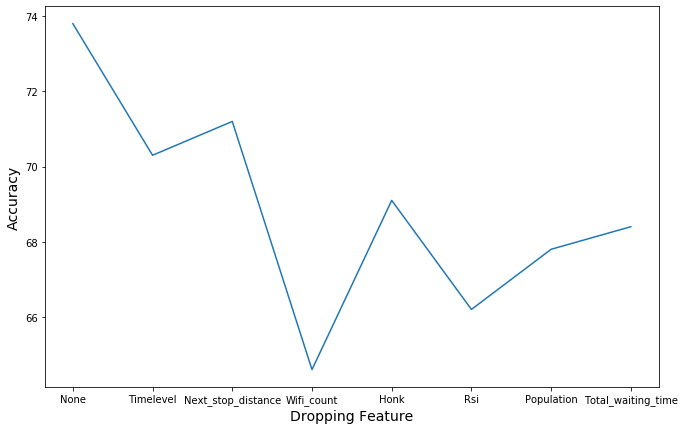

In [15]:
import matplotlib.pyplot as plt 
  
# x axis values 
x = ['None','Timelevel','Next_stop_distance','Wifi_count','Honk','Rsi','Population','Total_waiting_time'] 
# corresponding y axis values 
y = [73.8,70.3,71.2,64.6,69.1,66.2,67.8,68.4] 
  
fig=plt.figure(figsize=(11,7))
# plotting the points  
plt.plot(x, y) 
plt.xlabel('Dropping Feature',fontsize=14) 
# naming the y axis 
plt.ylabel('Accuracy', fontsize=14) 
plt.show()
# giving a title to my graph 
#plt.title('Showing Variation in accuracy with Considered Feature') 

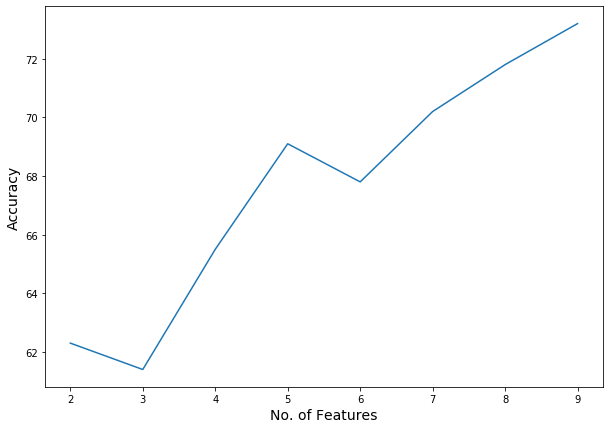

In [3]:
import matplotlib.pyplot as plt 
  
# x axis values 
x = [2,3,4,5,6,7,8,9] 
# corresponding y axis values 
y = [62.3,61.4,65.5,69.1,67.8,70.2,71.8,73.2] 
  
fig=plt.figure(figsize=(10,7))
# plotting the points  
plt.plot(x, y) 
plt.xlabel('No. of Features',fontsize=14) 
# naming the y axis 
plt.ylabel('Accuracy', fontsize=14) 
plt.show()

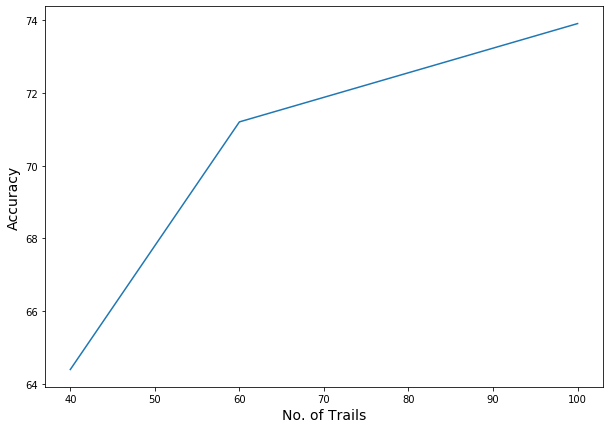

In [2]:
import matplotlib.pyplot as plt 
  
# x axis values 
x = [40,60,100] 
# corresponding y axis values 
y = [64.4,71.2,73.9] 
  
fig=plt.figure(figsize=(10,7))
# plotting the points  
plt.plot(x, y) 
plt.xlabel('No. of Trails',fontsize=14) 
# naming the y axis 
plt.ylabel('Accuracy', fontsize=14) 
plt.show()

In [4]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train_bus.csv')
df2=pd.read_csv('test_bus.csv')

X=df1[['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']].values
Y=df1['bus_stop'].values

classes=['bus_stop','not_bus_stop']
features=['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.2)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)

predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)


observation_1=45

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



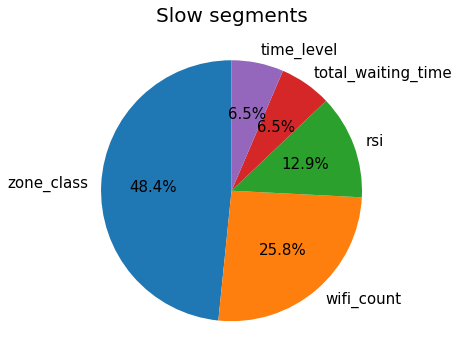

In [12]:
import matplotlib.pyplot as plt
data_value = [0.15,0.08,0.04,0.02,0.02]
sum_1=0.15+0.08+0.04+0.02+0.02
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['zone_class','wifi_count','rsi','total_waiting_time','time_level']

plt.figure(figsize=(6,6))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

In [5]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train_bus.csv')
df2=pd.read_csv('test_bus.csv')

X=df1[['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']].values
Y=df1['bus_stop'].values

classes=['bus_stop','not_bus_stop']
features=['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.2)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)

predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)


observation_1=34

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



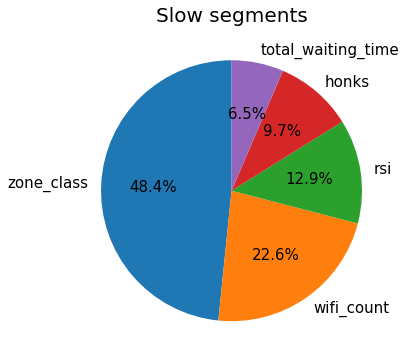

In [14]:
import matplotlib.pyplot as plt
data_value = [0.15,0.07,0.04,0.03,0.02]
sum_1=0.15+0.07+0.04+0.03+0.02
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['zone_class','wifi_count','rsi','honks','total_waiting_time']

plt.figure(figsize=(6,6))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

In [6]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train_bus.csv')
df2=pd.read_csv('test_bus.csv')

X=df1[['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']].values
Y=df1['bus_stop'].values

classes=['bus_stop','not_bus_stop']
features=['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.2)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)

predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)


observation_1=3

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



In [7]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train_bus.csv')
df2=pd.read_csv('test_bus.csv')

X=df1[['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']].values
Y=df1['bus_stop'].values

classes=['bus_stop','not_bus_stop']
features=['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.2)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)

predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)


observation_1=66

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



In [8]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train_bus.csv')
df2=pd.read_csv('test_bus.csv')

X=df1[['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']].values
Y=df1['bus_stop'].values

classes=['bus_stop','not_bus_stop']
features=['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.2)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)

predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)


observation_1=1

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



In [9]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train_bus.csv')
df2=pd.read_csv('test_bus.csv')

X=df1[['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']].values
Y=df1['bus_stop'].values

classes=['bus_stop','not_bus_stop']
features=['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.2)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)

predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)


observation_1=84

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



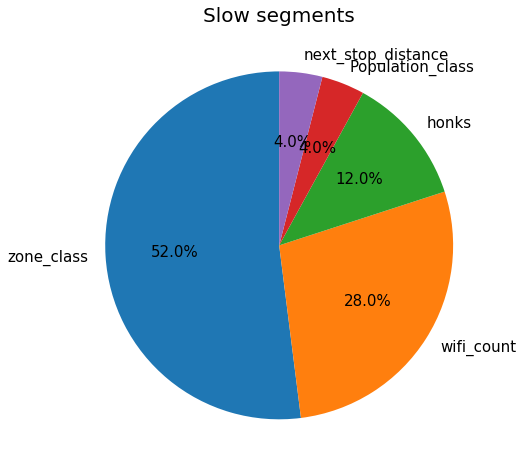

In [20]:
import matplotlib.pyplot as plt
data_value = [0.13,0.07,0.03,0.01,0.01]
sum_1=0.13+0.07+0.03+0.01+0.01
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['zone_class','wifi_count','honks','Population_class','next_stop_distance']

plt.figure(figsize=(8,8))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

In [10]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train_bus.csv')
df2=pd.read_csv('test_bus.csv')

X=df1[['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']].values
Y=df1['bus_stop'].values

classes=['bus_stop','not_bus_stop']
features=['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.2)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)

predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)


observation_1=91

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



In [11]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train_bus.csv')
df2=pd.read_csv('test_bus.csv')

X=df1[['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']].values
Y=df1['bus_stop'].values

classes=['bus_stop','not_bus_stop']
features=['zone_class','time_level','next_stop_distance','total_waiting_time','wifi_count','honks','Population_class','rsi','week_class']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.2)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)

predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)


observation_1=71

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



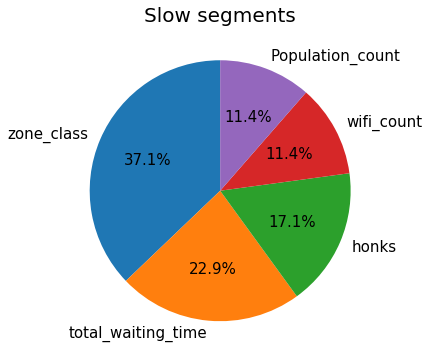

In [16]:
import matplotlib.pyplot as plt
data_value = [0.13,0.08,0.06,0.04,0.04]
sum_1=0.13+0.08+0.06+0.04+0.04
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['zone_class','total_waiting_time','honks','wifi_count','Population_count']

plt.figure(figsize=(6,6))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()